# Intro
This Jupyter notebook contains the R code needed to reproduce the figures, tables, and maps presented in the article.  
It is organized in the same way as the manuscript.  

However, before the figures are generated, the required R packages must be loaded and the input data pre‑processed.

## R Setup & Packages

In [1]:
# ---------- Packages required by the notebook ----------
pkgs_needed <- c(
    "colorspace",      # colour palettes
    "data.table",      # fast data‑frame manipulation
    "dplyr",           # data manipulation (used together with sf)
    "GWmodel",         # geographically weighted regression
    "ggplot2",         # static plots
    "ggspatial",       # spatial-aware scalebar annotation
    "here",            # project‑relative file paths
    "htmltools",       # HTML utilities for ggplot2/leaflet
    "IRdisplay",       # control size of Notebook cells for html based Leaflet
    "leaflet",         # interactive maps
    "knitr",           # chunk options (opts_chunk$set)
    "patchwork",       # combine ggplot2 panels
    "repr",            # control size of static plots
    "scales",          # axis/legend scaling helpers
    "sf",              # read/write geopackages, spatial joins
    "sfdep",           # spatial weights & LISA
    "stringr",         # string handling (e.g., str_to_title)
    "terra",           # raster & vector operations
    "tidyterra",       # ggplot2 support for terra objects
    "viridisLite"      # colour palettes for heat‑maps
)

# # Suppress messages and warnings while loading
# invisible(capture.output({
#     suppressWarnings({
#         lapply(pkgs_needed, library, character.only = TRUE)
#     })
# }))


# ---------- Install any missing packages ----------
missing_pkgs <- pkgs_needed[!pkgs_needed %in% rownames(installed.packages())]

if (length(missing_pkgs) > 0) {
  install.packages(missing_pkgs, dependencies = TRUE)
}

# ----------  Load all required packages ----------
invisible(lapply(pkgs_needed, library, character.only = TRUE, quietly = TRUE, warn.conflicts = FALSE))

# ----------  Set notebook plot settings ----------
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 300)

Welcome to GWmodel version 2.4-2.

here() starts at B:/tarox03_user4/Muenzinger/1_ioerData/replication_packages/localized_assessment_of_urban_forest_structures_with_3d_indicators/ioerDATA_upload

Linking to GEOS 3.13.0, GDAL 3.10.1, PROJ 9.5.1; sf_use_s2() is TRUE

terra 1.8.70



# Data Pre-processing
## Read and Clean Input Data


In [2]:
# # check project-relative filepath
print(here::here())

# ----------  Geopackages (.gpkg) with 100 m grid cells with CHM, BHM and LCZ info ----------

# Define relative paths to GPKGs 
amsterdam_3D_canopy_stats_lczv3_gpkg_path <- here::here( 'data', '3D_canopy_stats_lczv3_grid100m', 'amsterdam_3D_canopy_stats_lczv3_grid100m_lau2021_epsg28992.gpkg')
berlin_3D_canopy_stats_lczv3_gpkg_path <- here::here('data', '3D_canopy_stats_lczv3_grid100m', 'berlin_3D_canopy_stats_lczv3_grid100m_urau2021_epsg25833.gpkg')
amsterdam_3D_canopy_stats_lczv3_gpkg_path

# Read GPKGs using library sf
amsterdam_3D_canopy_stats_lczv3_gpkg <- sf::st_read(amsterdam_3D_canopy_stats_lczv3_gpkg_path, layer = "amsterdam_zones_100m_lcz_2018_v3_epsg28992")
berlin_3D_canopy_stats_lczv3_gpkg <- sf::st_read(berlin_3D_canopy_stats_lczv3_gpkg_path, layer = "berlin_zones_100m_lcz_2018_v3_epsg25833")

# Convert to data.table for data manipulation and plotting of figures
amsterdam_3D_canopy_stats_lczv3_dt <- data.table::as.data.table(amsterdam_3D_canopy_stats_lczv3_gpkg)
berlin_3D_canopy_stats_lczv3_dt <- data.table::as.data.table(berlin_3D_canopy_stats_lczv3_gpkg)

# Add column with city_name to both data.tables
amsterdam_3D_canopy_stats_lczv3_dt[, city_name := 'Amsterdam']
berlin_3D_canopy_stats_lczv3_dt[, city_name := 'Berlin']


# ---------- CSV file with LCZ classcodes, descriptions and color scheme ----------

# Path to csv with LCZ classcodes
lcz_v3_classcodes_csv_path <- here::here('data', 'global_lcz_v3_classcodes', 'lcz_2018_classcodes.csv')

# Read LCZ classcodes as data.table
lcz_classcodes_dt <- data.table::fread(lcz_v3_classcodes_csv_path)

# Remove column not needed
lcz_classcodes_dt[,code_alt:=NULL]

# Change column names for LCZ columns
data.table::setnames(lcz_classcodes_dt, c("description","hex_color"), c("lcz_description", "lcz_hex_color"))

[1] "B:/tarox03_user4/Muenzinger/1_ioerData/replication_packages/localized_assessment_of_urban_forest_structures_with_3d_indicators/ioerDATA_upload"


[1] "B:/tarox03_user4/Muenzinger/1_ioerData/replication_packages/localized_assessment_of_urban_forest_structures_with_3d_indicators/ioerDATA_upload/data/3D_canopy_stats_lczv3_grid100m/amsterdam_3D_canopy_stats_lczv3_grid100m_lau2021_epsg28992.gpkg"

Reading layer `amsterdam_zones_100m_lcz_2018_v3_epsg28992' from data source 
  `B:\tarox03_user4\Muenzinger\1_ioerData\replication_packages\localized_assessment_of_urban_forest_structures_with_3d_indicators\ioerDATA_upload\data\3D_canopy_stats_lczv3_grid100m\amsterdam_3D_canopy_stats_lczv3_grid100m_lau2021_epsg28992.gpkg' 
  using driver `GPKG'
Simple feature collection with 22468 features and 9 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 110241.9 ymin: 476788.9 xmax: 134029.8 ymax: 493911.1
Projected CRS: Amersfoort / RD New
Reading layer `berlin_zones_100m_lcz_2018_v3_epsg25833' from data source 
  `B:\tarox03_user4\Muenzinger\1_ioerData\replication_packages\localized_assessment_of_urban_forest_structures_with_3d_indicators\ioerDATA_upload\data\3D_canopy_stats_lczv3_grid100m\berlin_3D_canopy_stats_lczv3_grid100m_urau2021_epsg25833.gpkg' 
  using driver `GPKG'
Simple feature collection with 90530 features and 9 fields
Geometry type: MULTIPOLYGON
Dimension

## Indicator Calculation
- Indicators are described in **Section 2.2**.  
- Calculation is based on the values from the Canopy Height Models and Building Height Models that have already been joined to the individual cells.  
- Rounding of values:  
    - Percent values are always rounded to one decimal place.  
      - *Practically, this means that only cells with more than 5 m² `chm_area` **or** `bldg_area` are considered to have coverage. We analyse cells that are 1 ha in size and truncate the second decimal when rounding percentages, so any cell with a lower value is not taken into account.*  
    - The Canopy 3D Index is rounded to three decimal places.  
    - Metric values are rounded to two decimal places.  

In [3]:
# ---------- 2D ----------

# Canopy Coverage 
amsterdam_3D_canopy_stats_lczv3_dt[, canopy_coverage := round((chm_area/cell_area)*100, digits = 1)]
berlin_3D_canopy_stats_lczv3_dt[, canopy_coverage := round((chm_area/cell_area)*100, digits = 1)]

# Building Coverage
amsterdam_3D_canopy_stats_lczv3_dt[, bldg_coverage := round((bldg_area/cell_area)*100, digits = 1)]
berlin_3D_canopy_stats_lczv3_dt[, bldg_coverage := round((bldg_area/cell_area)*100, digits = 1)]

# ---------- 3D ----------

# Mean Canopy Height - Only Zones with canopy coverage will be considered
amsterdam_3D_canopy_stats_lczv3_dt[canopy_coverage>0, mean_canopy_height := round(chm_volume/chm_area, digits = 1)]
berlin_3D_canopy_stats_lczv3_dt[canopy_coverage>0, mean_canopy_height := round(chm_volume/chm_area, digits = 1)]

# Mean Building Height - Only Zones with building coverage will be considered
amsterdam_3D_canopy_stats_lczv3_dt[bldg_coverage>0, mean_bldg_height := round(bldg_volume/bldg_area, digits = 1)]
berlin_3D_canopy_stats_lczv3_dt[bldg_coverage>0, mean_bldg_height := round(bldg_volume/bldg_area, digits = 1)]

# Canopy 3D Index
amsterdam_3D_canopy_stats_lczv3_dt[,canopy_3D_index := ifelse(canopy_coverage>0, round(chm_volume/cell_area, digits = 3), 0)]
berlin_3D_canopy_stats_lczv3_dt[,canopy_3D_index := ifelse(canopy_coverage>0, round(chm_volume/cell_area, digits = 3), 0)]

# Building 3D Index
amsterdam_3D_canopy_stats_lczv3_dt[,bldg_3D_index := ifelse(bldg_coverage>0, round(bldg_volume/cell_area, digits = 3), 0)]
berlin_3D_canopy_stats_lczv3_dt[,bldg_3D_index := ifelse(bldg_coverage>0, round(bldg_volume/cell_area, digits = 3), 0)]

# ---------- Ratio of trees and buildings ----------

# CA2BA
# Only Zones that contain canopy and buildings will be considered
amsterdam_3D_canopy_stats_lczv3_dt[,CA2BA := ifelse(chm_area > 0 & bldg_area > 0, round((chm_area/(bldg_area+chm_area))*100, digits = 1), 
                        ifelse(chm_area > 0 & bldg_area == 0, 100,NA))]
berlin_3D_canopy_stats_lczv3_dt[,CA2BA := ifelse(chm_area > 0 & bldg_area > 0, round((chm_area/(bldg_area+chm_area))*100, digits = 1), 
                        ifelse(chm_area > 0 & bldg_area == 0, 100,NA))]

# CV2BV
# Only Zones that contain canopy and buildings will be considered
amsterdam_3D_canopy_stats_lczv3_dt[,CV2BV := ifelse(chm_area > 0 & bldg_area > 0, round((chm_volume/(bldg_volume+chm_volume))*100, digits = 1), 
                        ifelse(chm_area > 0 & bldg_area == 0, 100,NA))]
berlin_3D_canopy_stats_lczv3_dt[,CV2BV := ifelse(chm_area > 0 & bldg_area > 0, round((chm_volume/(bldg_volume+chm_volume))*100, digits = 1), 
                        ifelse(chm_area > 0 & bldg_area == 0, 100,NA))]

## Merge with LCZ class descriptions and color scheme
- Add LCZ classcode, descriptions and color scheme to each cell

In [4]:
# Merge LCZ classcodes to 3D_canopy_stats_lczv3_dt
amsterdam_3D_canopy_stats_lczv3_dt <- merge(amsterdam_3D_canopy_stats_lczv3_dt, lcz_classcodes_dt, by.x="lcz_class_value", by.y="code", all.x = TRUE)
berlin_3D_canopy_stats_lczv3_dt <- merge(berlin_3D_canopy_stats_lczv3_dt, lcz_classcodes_dt, by.x="lcz_class_value", by.y="code", all.x = TRUE)

## Combine DataTables (DTs) for Amsterdam and Berlin
 - The two DTs are combined to create faceted plots afterwards

In [5]:
# reorder columns 
setcolorder(amsterdam_3D_canopy_stats_lczv3_dt, c("city_name", "tile_id", "lcz_class_value", "lcz_description", "lcz_hex_color", 
                                                  "cell_area", "chm_area", "chm_volume", "bldg_area", "bldg_volume", 
                                                  "canopy_coverage", "mean_canopy_height", "canopy_3D_index", 
                                                  "bldg_coverage", "mean_bldg_height", "bldg_3D_index", 
                                                  "CA2BA", "CV2BV", 
                                                  "centroid_x", "centroid_y", "geom"))

setcolorder(berlin_3D_canopy_stats_lczv3_dt, c("city_name", "tile_id", "lcz_class_value", "lcz_description", "lcz_hex_color", 
                                                  "cell_area", "chm_area", "chm_volume", "bldg_area", "bldg_volume", 
                                                  "canopy_coverage", "mean_canopy_height", "canopy_3D_index", 
                                                  "bldg_coverage", "mean_bldg_height", "bldg_3D_index", 
                                                  "CA2BA", "CV2BV", 
                                                  "centroid_x", "centroid_y", "geom"))

# combine DTs 
combined_3D_canopy_stats_lczv3_dt <-  rbindlist(list(amsterdam_3D_canopy_stats_lczv3_dt, berlin_3D_canopy_stats_lczv3_dt))

## Create empty raster templates for map visualization
- Raster templates are used to rasterize values from Vector grid 
- enable faster Visualization with Layoer overlay

In [6]:
# ----------  Create empty raster template ----------

# Define cell size (same units as CRS (m))
cell_size <- 100

# derive extent of city boundary from SpatVector
amsterdam_boundary_ext <- terra::ext(amsterdam_3D_canopy_stats_lczv3_gpkg)
berlin_boundary_ext <- terra::ext(berlin_3D_canopy_stats_lczv3_gpkg)

# recreate clean extents of original grid 
amsterdam_grid_ext <- terra::ext(floor(amsterdam_boundary_ext[1] / cell_size) * cell_size, # xmin
                            ceiling(amsterdam_boundary_ext[2] / cell_size) * cell_size, #xmax
                            floor(amsterdam_boundary_ext[3] / cell_size) * cell_size, # ymin
                            ceiling(amsterdam_boundary_ext[4] / cell_size) * cell_size) # ymax

berlin_grid_ext <- terra::ext(floor(berlin_boundary_ext[1] / cell_size) * cell_size, # xmin
                            ceiling(berlin_boundary_ext[2] / cell_size) * cell_size, #xmax
                            floor(berlin_boundary_ext[3] / cell_size) * cell_size, # ymin
                            ceiling(berlin_boundary_ext[4] / cell_size) * cell_size) # ymax

# Create empty raster templates with the extent from the grid 
amsterdam_raster_template <- terra::rast(terra::ext(amsterdam_grid_ext), 
                   resolution = cell_size, 
                   crs        = terra::crs(amsterdam_3D_canopy_stats_lczv3_gpkg))

berlin_raster_template <- terra::rast(terra::ext(berlin_grid_ext), 
                   resolution = cell_size, 
                   crs        = terra::crs(berlin_3D_canopy_stats_lczv3_gpkg))

# 2. Material and Methods

## 2.3 Characterizing the study area

### Figure 1
#### Combine subpolots
- Specify width and height of figure manually 

#### Figure 1a: Barplot of abolsute (km²) and relative (%) shares of Local Climate Zones (LCZ) within both study areas

**Steps:**

- Aggregate area by city
- Aggregate area by LCZ and city
  - Exclude cells without LCZ classication (Amsterdam n=28, Berlin n=10)
- Merge total city area to aggregation by LCZ and city
- Calculate percentage of LCZ area on total area
- Control order of LCZs in plot by conversion to factor

#### Figure 1b: Stacked histogram of canopy coverage within the 1 ha cells colored by LCZ color scheme.

**Steps:** 

- Calculate overall statistics for canopy coverage for both cities
- Create labels which will be added to plot:
  - Mean 
  - Max
  - Number of cells without tree cover
- Plot stacked histogram
  - Exclude cells without tree cover from plot because they would dominate scales 


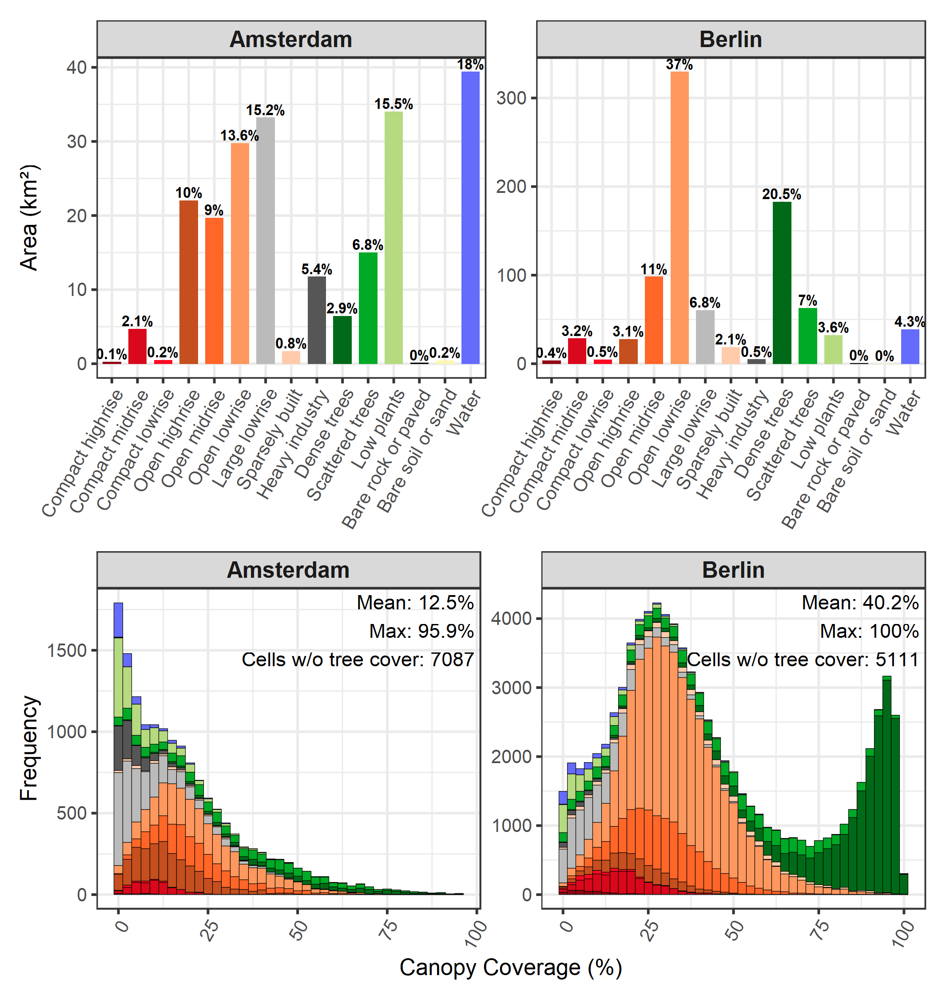

In [7]:
# ----------  Fig. 1a - LCZ shares for both cities ----------

# calculate area (m²) by city
city_area_aggr_dt <- combined_3D_canopy_stats_lczv3_dt[,
                                                      .(city_area_m2 = sum(cell_area)),
                                                      by = c("city_name")]

# calculate area (m²) by LCZ and city
# also specify "lcz_description" & "lcz_hex_color" in aggregation to keep this columns
lcz_city_area_aggr_dt <- combined_3D_canopy_stats_lczv3_dt[lcz_class_value!=0,
                                                          .(lcz_area_m2 = sum(cell_area)),
                                                            by = c("city_name", "lcz_class_value", "lcz_description", "lcz_hex_color")]

# calculate area in km2
lcz_city_area_aggr_dt[, lcz_area_km2 := lcz_area_m2/1000000]

# merge city area to lcz_aggr
lcz_city_area_aggr_dt <- merge(lcz_city_area_aggr_dt, city_area_aggr_dt, by = "city_name")

# calculate percentage of lcz on total area
lcz_city_area_aggr_dt[, lcz_area_share := round((lcz_area_m2/city_area_m2)*100, digits = 1)]

# convert lcz_description to factor
lcz_description_levels <- c("Compact highrise","Compact midrise","Compact lowrise",
            "Open highrise","Open midrise","Open lowrise",
            "Lightweight low-rise","Large lowrise","Sparsely built",
            "Heavy industry","Dense trees","Scattered trees",
            "Low plants","Bare rock or paved","Bare soil or sand","Water")

# convert column description to factor for plotting
lcz_city_area_aggr_dt[, lcz_description := factor(lcz_description, levels=lcz_description_levels)]

# create plot- add relative share (%) as labels above each bar 
fig1a_area_by_lcz_barplot <- ggplot(lcz_city_area_aggr_dt, aes(x = lcz_description, y = lcz_area_km2, fill = lcz_hex_color)) +
  theme_bw()+
  geom_bar(stat = "identity", width = 0.7) +
  facet_wrap(~city_name, scales = "free", labeller = as_labeller(stringr::str_to_title))+
  scale_fill_identity() +  # Use the color values directly from the 'lcz_hex_color' column
  geom_text(aes(label = paste0(lcz_area_share, "%")),
            position = position_stack(), size = 2.75, vjust=-0.25, fontface="bold") +
  labs(y = "Area (km²)") +
  theme(
      strip.text = element_text(face = "bold", size = 12),  # Facet title size
      axis.title.x = element_blank(),  # X-axis label size
      axis.title.y = element_text(size = 12),  # Y-axis label size
      axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
      axis.text.y = element_text(size = 10)   # Y-axis tick labels
    )

# fig1a_area_by_lcz_barplot

# ----------  Fig. 1b - Histogram Canopy Coverage by LCZ ----------

# Canopy Coverage Stats by City
city_cc_stats_aggr_dt <- combined_3D_canopy_stats_lczv3_dt[, .(max_canopy_coverage_all_lcz = max(canopy_coverage),
                                                              mean_canopy_coverage_all_lcz = round(sum(chm_area)/ sum(cell_area)*100, digits = 1),
                                                              median_canopy_coverage_all_lcz = median(canopy_coverage), 
                                                              variance_canopy_coverage_all_lcz = var(canopy_coverage), 
                                                              sd_canopy_coverage_all_lcz = sd(canopy_coverage), 
                                                              iqr_canopy_coverage_all_lcz = IQR(canopy_coverage),
                                                              zero_count = sum(canopy_coverage==0)),
                                                          by = c("city_name")]

# Create label from statistics
city_cc_stats_aggr_dt[, label := paste0("Mean: ", mean_canopy_coverage_all_lcz,'% ','\n',
                                        "Max: ",round(max_canopy_coverage_all_lcz,1),'% ','\n',
                                        "Cells w/o tree cover: ",zero_count,' ')]

# convert column hex_color to factor to control stacking order of histogram
lcz_hex_color_levels <- c("#910613", "#D9081C", "#FF0A22", 
                          "#C54F1E", "#FF6628", "#FF985E", 
                          "#FDED3F", "#BBBBBB", "#FFCBAB", 
                          "#565656", "#006A18", "#00A926", 
                          "#628432", "#B5DA7F", "#000000", 
                          "#FCF7B1", "#656BFA")

combined_3D_canopy_stats_lczv3_dt[, lcz_hex_color := factor(lcz_hex_color, levels=rev(lcz_hex_color_levels))]

# plot stacked histogram 
fig1b_stacked_hist_canopy_coverage <- ggplot(data = combined_3D_canopy_stats_lczv3_dt[canopy_coverage>0], aes(x = canopy_coverage, fill = lcz_hex_color)) +
    theme_bw()+
    geom_histogram(binwidth = 2.5, position = "stack", color = "black", linewidth = 0.1) + # control width of histogram bins
    scale_fill_identity()+ # Use the color values directly from the 'lcz_hex_color' column
    geom_text(data = city_cc_stats_aggr_dt, aes(x = Inf, y = Inf, label = label), 
              inherit.aes = FALSE, hjust = 1, vjust = 1.1, size = 3.75, color = "black")+ # add label to top right corner
    labs(x = "Canopy Coverage (%)",
         y = "Frequency")+
    facet_wrap(~ city_name, scales = "free", labeller = as_labeller(stringr::str_to_title))+
    theme(
      strip.text = element_text(face = "bold", size = 12),  # Facet title size
      axis.title.x = element_text(size = 12),  # X-axis label size
      axis.title.y = element_text(size = 12),  # Y-axis label size
      axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
      axis.text.y = element_text(size = 10)   # Y-axis tick labels
    )
  
# fig1b_stacked_hist_canopy_coverage


# ----------  Combine into 2 rows × 2 cols ----------
# Set new width and height (in inches) for this figure only
options(repr.plot.width = 7.1, repr.plot.height = 7.5, repr.plot.res = 300)
figure1_study_area_characteristics <- fig1a_area_by_lcz_barplot / fig1b_stacked_hist_canopy_coverage
figure1_study_area_characteristics

# Restore previous settings so other cells are unaffected
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 300)

### Figure 2: Spatial distribution of Local Climate Zones (LCZ) across Amsterdam and Berlin

- Map Viewer with LCZ Layer can be found below 
- Rasterize LCZ classcodes to Raster template
- Merge LCZ Color Scheme from imported CSV
- Static Plot with GGPLOT2


Using plotunit = 'm'

Using plotunit = 'm'



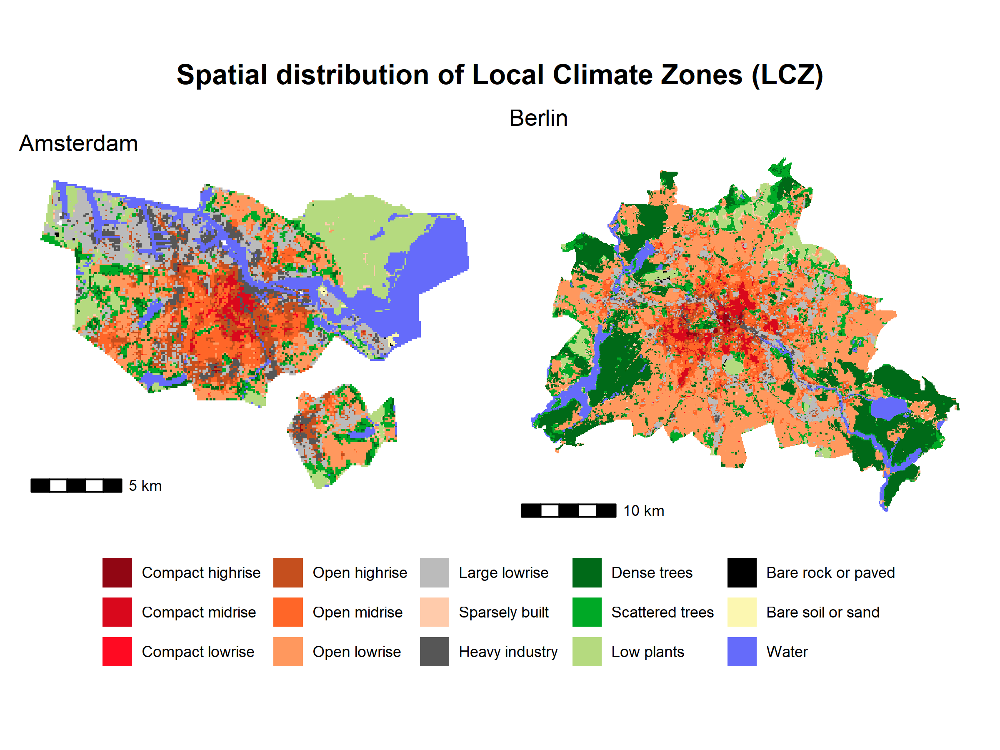

In [8]:
# ----------  Create LCZ Raster Layer ----------

# 1. Rasterize from SpatVector
# 2. Build Color Palette

# Rasterize LCZ classcodes
lcz_classcodes_amsterdam_sr <- terra::rasterize(amsterdam_3D_canopy_stats_lczv3_gpkg,
                     amsterdam_raster_template,
                     field = "lcz_class_value",
                     fun   = "max",
                     background = NA)

lcz_classcodes_berlin_sr <- terra::rasterize(berlin_3D_canopy_stats_lczv3_gpkg,
                     berlin_raster_template,
                     field = "lcz_class_value",
                     fun   = "max",
                     background = NA)

# replace cells with 0 to NA (missing values in LCZ Map)
lcz_map_amsterdam_sr <- terra::classify(lcz_classcodes_amsterdam_sr, cbind(0, NA))
lcz_map_berlin_sr <- terra::classify(lcz_classcodes_berlin_sr, cbind(0, NA))


# store all LCZ codes present in maps
lcz_map_amsterdam_sr_unique_vals <- sort(unique(terra::values(lcz_map_amsterdam_sr)))  # or use `na.omit(unique(vals))`
lcz_map_berlin_sr_unique_vals <- sort(unique(terra::values(lcz_map_berlin_sr)))  # or use `na.omit(unique(vals))`

# Subset LCZ classcodes DT to match values in maps
lcz_classcodes_amsterdam_dt <- lcz_classcodes_dt[code %in% lcz_map_amsterdam_sr_unique_vals]
lcz_classcodes_berlin_dt <- lcz_classcodes_dt[code %in% lcz_map_berlin_sr_unique_vals]


# Create a numeric color function - suitable for leaflet map view 
# create color palettes for the existing codes
lcz_amsterdam_pal <- colorNumeric(
  palette = lcz_classcodes_amsterdam_dt$lcz_hex_color,
  domain = lcz_classcodes_amsterdam_dt$code,
  na.color = "transparent"
)

lcz_berlin_pal <- colorNumeric(
  palette = lcz_classcodes_berlin_dt$lcz_hex_color,
  domain = lcz_classcodes_berlin_dt$code,
  na.color = "transparent"
)

# ---------- Prepare for ggplot2 ----------

# Convert SpatRasters to DF for ggplot
lcz_map_amsterdam_df <- as.data.frame(lcz_map_amsterdam_sr, xy = TRUE)
lcz_map_berlin_df <- as.data.frame(lcz_map_berlin_sr, xy = TRUE)

# rename column "lcz_class_value" to "code"
names(lcz_map_amsterdam_df)[3] <- "code"
names(lcz_map_berlin_df)[3] <- "code"

# Merge with color table to get hex colors
lcz_map_amsterdam_df <- merge(lcz_map_amsterdam_df, lcz_classcodes_amsterdam_dt, by.x = "code", by.y = "code", all.x = TRUE)
lcz_map_berlin_df <- merge(lcz_map_berlin_df, lcz_classcodes_berlin_dt, by.x = "code", by.y = "code", all.x = TRUE)

# Add a factor column to the raster dataframe for legend labels
lcz_map_amsterdam_df$class_label <- factor(lcz_map_amsterdam_df$code, levels = lcz_classcodes_amsterdam_dt$code, labels = lcz_classcodes_amsterdam_dt$lcz_description)
lcz_map_berlin_df$class_label <- factor(lcz_map_berlin_df$code, levels = lcz_classcodes_berlin_dt$code, labels = lcz_classcodes_berlin_dt$lcz_description)

# Build color mapping vector (self-contained)
amsterdam_color_map_vec <- setNames(lcz_classcodes_amsterdam_dt$lcz_hex_color, lcz_classcodes_amsterdam_dt$lcz_description)
berlin_color_map_vec <- setNames(lcz_classcodes_berlin_dt$lcz_hex_color, lcz_classcodes_berlin_dt$lcz_description)

# ---------- Plot with ggplot2 ----------

# Amsterdam
fig2a_amsterdam_lcz_map_plot <- ggplot(lcz_map_amsterdam_df, aes(x = x, y = y, fill = class_label)) +
  geom_tile() +
  scale_fill_manual(
    values = amsterdam_color_map_vec,
    na.value = "transparent",
    name = "LCZ") + 
  guides(fill = guide_legend(title = NULL))+
  annotation_scale(
    location = "bl",  # bottom-left corner
    width_hint = 0.2, # size of the scale bar relative to plot
    text_cex = 0.7    # text size
  ) +
  ggtitle("Amsterdam") +
  coord_equal() +
  theme_minimal() +
  theme(
    axis.title = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    panel.grid = element_blank(),
    plot.title = element_text(hjust = 0)
  )

# fig2a_amsterdam_lcz_map_plot

# Berlin
fig2b_berlin_lcz_map_plot <- ggplot(lcz_map_berlin_df, aes(x = x, y = y, fill = class_label)) +
  geom_tile() +
  scale_fill_manual(
    values = berlin_color_map_vec,
    na.value = "transparent",
    name = "LCZ") + 
  annotation_scale(
    location = "bl",  # bottom-left corner
    width_hint = 0.2, # size of the scale bar relative to plot
    text_cex = 0.7    # text size
  ) +
  guides(fill = guide_legend(title = NULL))+
  ggtitle("Berlin") +
  coord_equal() +
  theme_minimal() +
  theme(
    axis.title = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    panel.grid = element_blank(),
    plot.title = element_text(hjust = 0)
  )

# fig2b_berlin_lcz_map_plot

# ---------- Combine subplots ----------

# Combine subplots with shared legend using package "patchwork"
figure2_lcz_spatial_distribution <- fig2a_amsterdam_lcz_map_plot + fig2b_berlin_lcz_map_plot + 
  plot_layout(guides = "collect") &   # collect legends into one
  theme(legend.position = "bottom") &  # place legend at bottom
  plot_annotation(
    title = "Spatial distribution of Local Climate Zones (LCZ)", theme = theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 16)
    )
  )

# Display
figure2_lcz_spatial_distribution

# 3. Results 

## 3.1 Relationship between horizontal and vertical urban forest structure

### Figure 3: Scatterplot visualizing the relationship between canopy coverage and mean canopy height overlaid with 2D kernel density contours.

**Steps:**

- Calculate Spearman Rank Correlation between both variables
  - Only use cells with canopy coverage
- Create label with correlation values
- Create scatterplot 
- Add 2D kernel density contours around clusters

# 3. Results 

## 3.1 Relationship between horizontal and vertical urban forest structure

### Figure 3: Scatterplot visualizing the relationship between canopy coverage and mean canopy height overlaid with 2D kernel density contours.

**Steps:**

- Calculate Spearman Rank Correlation between both variables
  - Only use cells with canopy coverage
- Create label with correlation values
- Create scatterplot 
- Add 2D kernel density contours around clusters

Warning message in cor.test.default(canopy_coverage, mean_canopy_height, method = "spearman"):
"Kann exakten p-Wert bei Bindungen nicht berechnen"
Warning message in cor.test.default(canopy_coverage, mean_canopy_height, method = "spearman"):
"Kann exakten p-Wert bei Bindungen nicht berechnen"


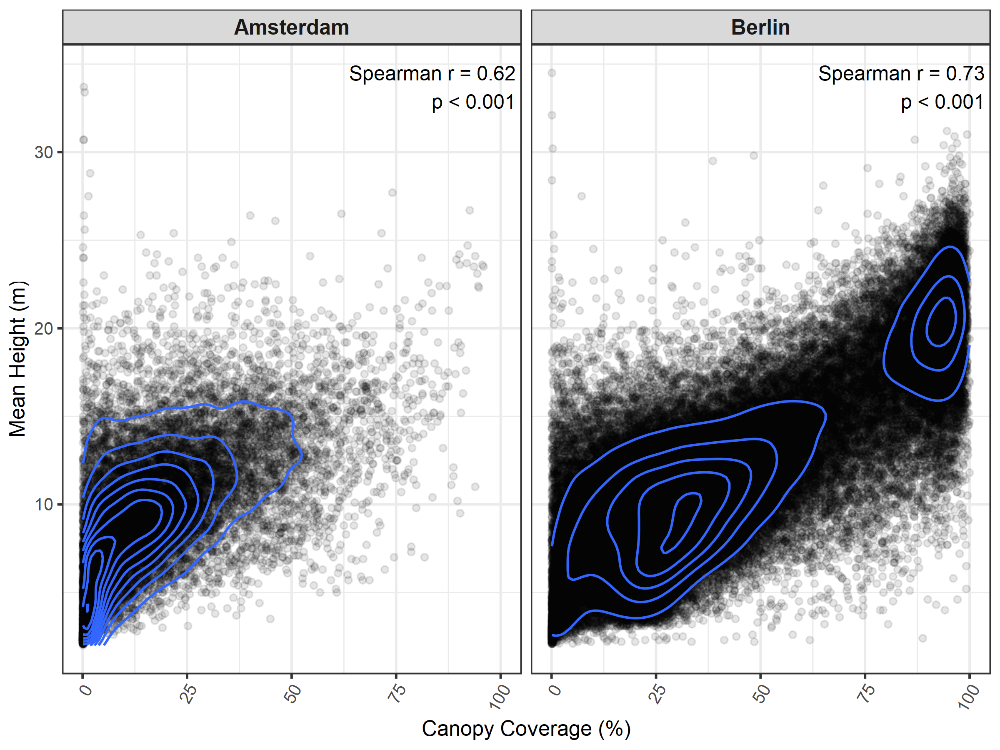

In [9]:
# ---------- Calculate Spearman Rank Correlation ----------

# Spearman Rank Correlation
cc_mch_cor_spear <- combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0, {
  cor_spear <- cor.test(canopy_coverage, mean_canopy_height, method = "spearman")
# Return results as a list
  # Combine these metrics into a list to be returned for each category.
  list(
    spear_pho = round(cor_spear$estimate, 2),
    spear_p = round(cor_spear$p.value, 10)
    )
}, by = city_name]

# Create label
cc_mch_cor_spear[,label := paste0('Spearman r = ', spear_pho, ' ', '\n ', 'p < 0.001', ' ')]  

# ---------- Create Plot ----------

# Scatterplot with KDE and LM
fig3_scatterplot_cc_mch <- ggplot(combined_3D_canopy_stats_lczv3_dt[canopy_coverage>0], aes(x=canopy_coverage, y=mean_canopy_height)) +
  theme_bw()+
  geom_point(alpha = 0.1) + # set transparency of points
  geom_density2d()+ # add density contours
  labs(
    x = "Canopy Coverage (%)", 
    y = "Mean Height (m)")+
  facet_wrap(~ city_name, labeller = as_labeller(stringr::str_to_title))+
  geom_text(data = cc_mch_cor_spear, aes(x = Inf, y = Inf, label = label), 
              inherit.aes = FALSE, hjust = 1, vjust = 1.5, size = 4)+  # Add correlation label
  theme(
    strip.text = element_text(face = "bold", size = 12),  # Facet title size
    axis.title.x = element_text(size = 12),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
    axis.text.y = element_text(size = 10)   # Y-axis tick labels
  )

fig3_scatterplot_cc_mch

### Table 1: Bin-wise statistics of mean canopy height in relation to canopy coverage.

**Steps:**

- Define bins
- Assign bins according to canopy coverage
- Aggregate values by bin

In [10]:
# ---------- Create Table ----------

# Extract only colums canopy_Coverage and mean_canopy_height 
# Filter cells without canopy
binwise_stats_cc_mch_dt <- combined_3D_canopy_stats_lczv3_dt[canopy_coverage>0,.(canopy_coverage, mean_canopy_height, city_name)]

# Define manual bins (ensuring X=0 is excluded and 100 is included)
bin_breaks <- c(0, seq(25, 100, by = 25))  

# Create labels for the bins
bin_labels <- paste0("(", head(bin_breaks, -1), ",", tail(bin_breaks, -1), "]") 

# Assign bins according to canopy coverage (right=TRUE includes 100)
binwise_stats_cc_mch_dt[,cc_bin := cut(canopy_coverage, breaks = bin_breaks, labels = bin_labels, right = TRUE, include.lowest = FALSE), by= "city_name"]

# Table 1 - Binwise stastistics thorugh aggregation
table1_binwise_aggr_dt <- binwise_stats_cc_mch_dt[, .(sd_mch = round(sd(mean_canopy_height), digits=1), # standard deviation
                                               median_mch = median(mean_canopy_height), # median height
                                               mean_mch = round(mean(mean_canopy_height), digits=1), # mean height
                                               count_cells = .N), 
                                           by = c("cc_bin", "city_name")]

# Calculation of the share of cells in each bin of all cells with tree cover
table1_binwise_aggr_dt[, share_cell_count := round((count_cells/sum(count_cells))*100, digits=0), by="city_name"]

table1_binwise_aggr_dt

cc_bin,city_name,sd_mch,median_mch,mean_mch,count_cells,share_cell_count
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
"(0,25]",Amsterdam,3.5,8.4,8.6,11301,73
"(25,50]",Amsterdam,3.2,11.9,12.1,3141,20
"(50,75]",Amsterdam,3.5,13.9,13.8,810,5
"(75,100]",Amsterdam,4.1,16.3,16.7,129,1
"(0,25]",Berlin,3.1,8.2,8.4,26743,31
"(25,50]",Berlin,2.8,10.2,10.3,31677,37
"(50,75]",Berlin,3.3,13.9,14.0,10171,12
"(75,100]",Berlin,3.5,19.5,19.2,16828,20


### Figure 4: Relationship between canopy coverage and canopy 3D index.

**Steps:**

- Create 3 individual plots and combine in the end
- **Fig 4a:** Quadratic Regression for all cells with canopy cover
  - Create labels for regression curve
  - Create Scatterplot and with regression curve and labels
- **Fig 4b:** Residuals plot
  - Define regression model for both cities
  - Predict residuals
  - Plot residuals in scatterplot in relation to canopy coverage
- **Fig. 4c:** Resiudals % Error
  - Calculate residuals percent error
  - In order to have a better graphical overview of the distribution, residual percentage errors smaller than -100 and larger than 300 % were not plotted
  - Plot residuals percent error in scatterplot in relation to canopy coverage

[1] "Fig 4c: A total of 970 points were outside the scale range"


Warning message:
"Removed 970 rows containing missing values or values outside the scale range (`geom_point()`)."


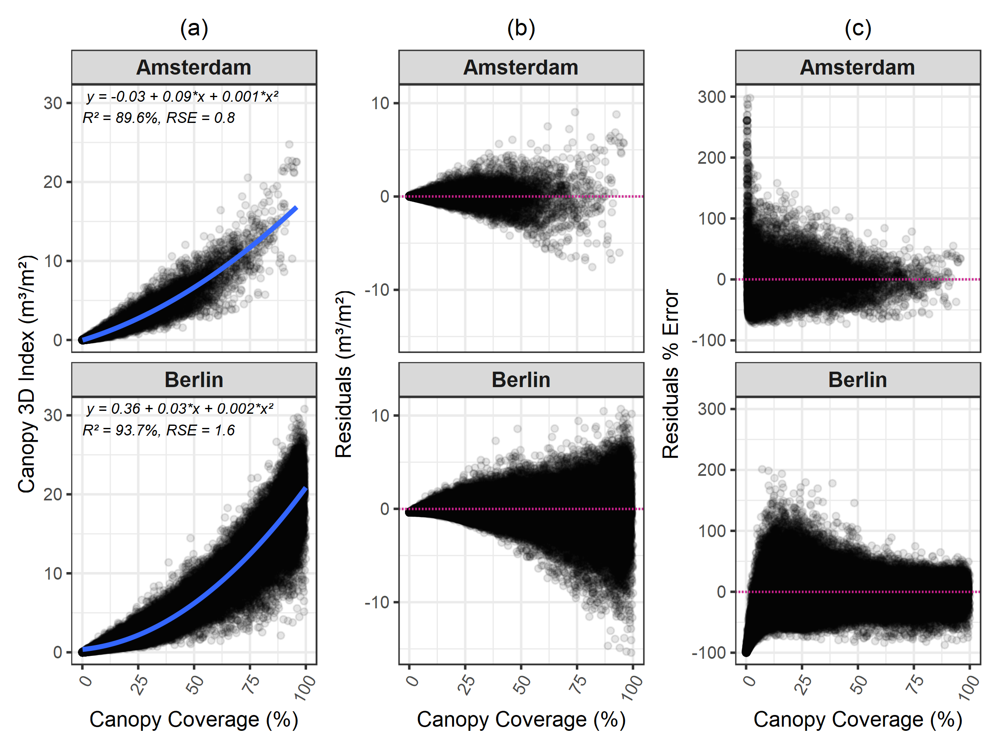

In [11]:
# ---------- Fig 4a ----------

# Define regression model and extract parameters
# Store in label 
fig_4a_labels <- combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0, {
  model <- lm(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2)) # define quadratic regression
  summary <- summary(model) 
  coef_model <- coef(model)
  r_squared <- round(summary$r.squared*100, digits=1) 
  rse <- round(summary$sigma, digits = 1)
  label <- paste0(" y = ", round(coef_model[1], 2), " + ", round(coef_model[2], 2), "*x + ", round(coef_model[3], 3), "*x²"
                  ,"\n", "R² = ",r_squared, "%, RSE = ",  rse, " ")
  .(label)
}, by = c("city_name")]

# Create scatterplot and add regression curve
fig4a_scatterplot_regression_curve <- ggplot(combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0], aes(x=canopy_coverage, y=canopy_3D_index)) +
  theme_bw()+
  geom_point(alpha = 0.1) + # set transparency of points
  geom_smooth(method = "lm", formula = y ~ poly(x, 2), se = TRUE) +  # Polynomial regression curve of degree 2
  labs(title = "(a)", 
       x = "Canopy Coverage (%)", 
       y = "Canopy 3D Index (m³/m²)")+
  facet_wrap(~ city_name, labeller = as_labeller(stringr::str_to_title), ncol=1)+ # vertical layout of facets
  geom_text(data = fig_4a_labels, aes(x = 0, y = Inf, label = label), 
            inherit.aes = FALSE, hjust = 0, vjust = 1.2, size = 3, color = "black", fontface= "italic") +  # Add formula text

  theme(
    plot.title = element_text(hjust = 0.5),  # Center the title
    strip.text = element_text(face = "bold", size = 12),  # Facet title size and style
    axis.title.x = element_text(size = 12),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
    axis.text.y = element_text(size = 10)   # Y-axis tick labels
  )

# ---------- Fig 4b - Residuals Plot ----------

# Define regression model for both cities to predict residuals 
amsterdam_canopy_quadratic_model <- lm(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2), 
                                       data = combined_3D_canopy_stats_lczv3_dt[city_name=="Amsterdam" & canopy_coverage > 0])
berlin_canopy_quadratic_model <- lm(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2),
                                    data = combined_3D_canopy_stats_lczv3_dt[city_name=="Berlin" & canopy_coverage > 0])

# Add fitted values and residuals to the data.table
combined_3D_canopy_stats_lczv3_dt[city_name=="Amsterdam" & canopy_coverage > 0, cqm_fitted_values := predict(amsterdam_canopy_quadratic_model)]
combined_3D_canopy_stats_lczv3_dt[city_name=="Berlin"& canopy_coverage > 0, cqm_fitted_values := predict(berlin_canopy_quadratic_model)]

# Calculate residuals
combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0, cqm_residuals := canopy_3D_index - cqm_fitted_values]

# Plot Residuals vs Canopy Coverage
fig4b_residuals_plot <- ggplot(combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0], aes(x = canopy_coverage, y = cqm_residuals)) +
  theme_bw()+
  geom_point(alpha = 0.1) +
  geom_hline(yintercept = 0, col = "violetred", linetype = "dashed") +
  labs(title = "(b)",
       x = "Canopy Coverage (%)",
       y = "Residuals (m³/m²)") +
  facet_wrap(~ city_name, labeller = as_labeller(stringr::str_to_title), ncol=1)+
  theme(
    plot.title = element_text(hjust = 0.5),  # Center the title
    strip.text = element_text(face = "bold", size = 12),  # Facet title size and style
    axis.title.x = element_text(size = 12),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
    axis.text.y = element_text(size = 10)   # Y-axis tick labels
  )

# ---------- Fig 4c - Resdiuals Perc Error ----------

# Calculate Residuals Percent Error
combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0, cqm_percent_error := (cqm_residuals / cqm_fitted_values) * 100]

# Count residual percentage errors smaller than -100 and larger than 300 %
count_removed_points <- combined_3D_canopy_stats_lczv3_dt[cqm_percent_error >300 | cqm_percent_error < -100]
print(paste0('Fig 4c: A total of ', nrow(count_removed_points), ' points were outside the scale range' ))

# Plot percent error vs Canopy Coverage
fig_4c_res_perc_error <- ggplot(combined_3D_canopy_stats_lczv3_dt[canopy_coverage > 0], aes(x = canopy_coverage, y = cqm_percent_error)) +
  theme_bw()+
  geom_point(alpha = 0.1) +
  geom_hline(yintercept = 0, col = "violetred", linetype = "dashed") +
  labs(title = "(c)",
       x = "Canopy Coverage (%)",
       y = "Residuals % Error") +
  facet_wrap(~ city_name, labeller = as_labeller(stringr::str_to_title), ncol=1)+
  ylim(-100, 300)+
  theme(
    plot.title = element_text(hjust = 0.5),  # Center the title
    strip.text = element_text(face = "bold", size = 12),  # Facet title size and style
    axis.title.x = element_text(size = 12),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
    axis.text.y = element_text(size = 10)   # Y-axis tick labels
  )

# ---------- Combine the plots with patchwork package ----------
 
fig4_comnbined_plot <- (fig4a_scatterplot_regression_curve | fig4b_residuals_plot | fig_4c_res_perc_error)  # 1 row, 3 columns
fig4_comnbined_plot

## 3.2 Vertical impact on the spatial relationship between trees and buildings

### Figure 5: Relationship between canopy coverage and building coverage.

**Steps:**

- Create scatterplot between canopy and building coverage
- Annotate zones for CA2BA by colour
  - Share of trees bigger than share of buildings -> CA2BA > 50 -> color: forestgreen
  - Share of trees smaller than share of buildings -> CA2BA < 50 -> color: red
- Add 2D kernel density contours around clusters

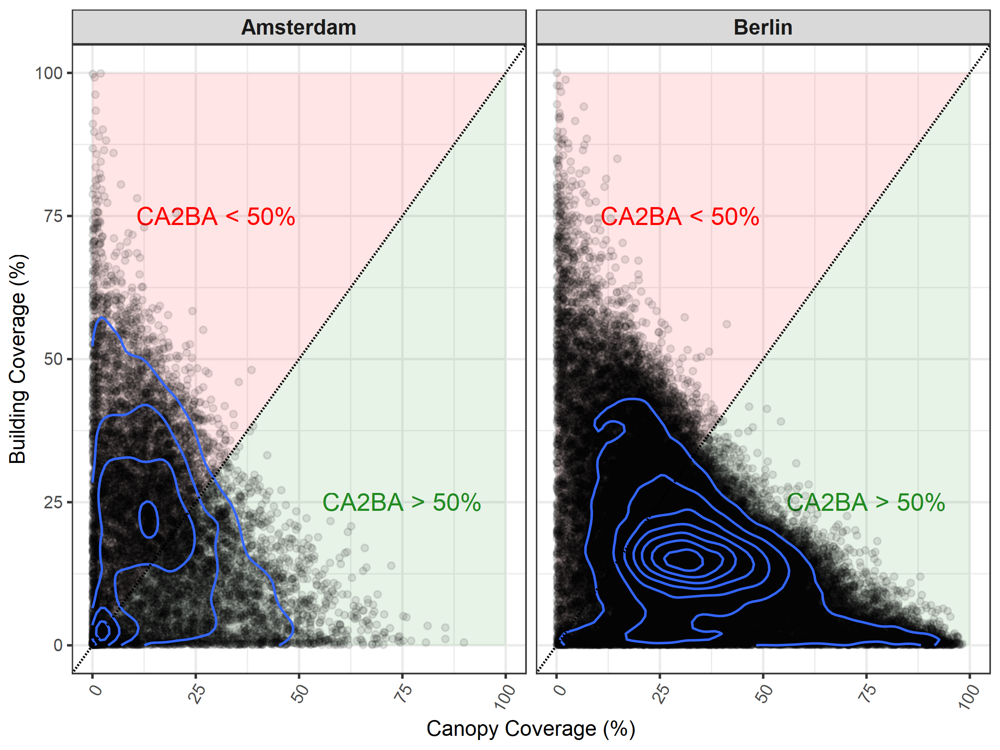

In [12]:
fig5_scatterplot_canopy_bldg_2D <- ggplot(combined_3D_canopy_stats_lczv3_dt[canopy_coverage>0 & bldg_coverage>0], aes(x=canopy_coverage, y=bldg_coverage)) +
  theme_bw()+
  # Add background for CA2BA > 50
  annotate("polygon",
           x = c(0, 100, 100), # X-coordinates of the triangle's vertices
           y = c(0, 0, 100), # Y-coordinates of the triangle's vertices
           fill = "forestgreen", alpha = 0.1)+
  annotate("text", x = 75, y = 25, label = "CA2BA > 50%", color = "forestgreen", size = 5)+
    # Add background for CA2BA < 50
  annotate("polygon",
           x = c(0, 0, 100), # X-coordinates of the triangle's vertices
           y = c(0, 100, 100), # Y-coordinates of the triangle's vertices
           fill = "red", alpha = 0.1)+
  annotate("text", x = 30, y = 75, label = "CA2BA < 50%", color = "red", size = 5)+
  geom_point(alpha = 0.1) +
  geom_density_2d() +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "black", linewidth = 0.5) +  # Add line of equality
  labs(x = "Canopy Coverage (%)", 
       y = "Building Coverage (%)")+
  facet_wrap(~ city_name, labeller = as_labeller(stringr::str_to_title))+
  theme(
    strip.text = element_text(face = "bold", size = 12),  # Facet title size and style
    axis.title.x = element_text(size = 12),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
    axis.text.y = element_text(size = 10)   # Y-axis tick labels
  )

fig5_scatterplot_canopy_bldg_2D

### Figure 6: Relationship between CA2BA and CV2BV.

**Steps:**

- Define number of bins
- Generate labels for bins
- Define color palette for kernel density estimates with 5 bins
- Set transparancy for bins of density estimate


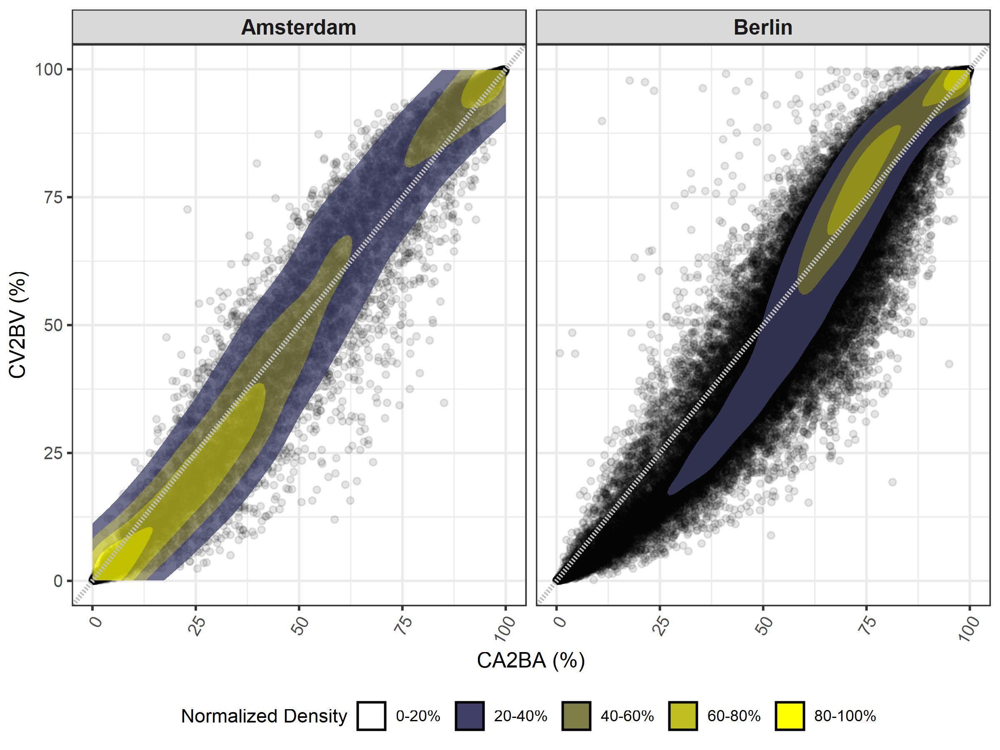

In [13]:
# ---------- Prepare Plot ----------

# Define number of bins 
n_bins <- 5

# Generate percentage labels for density bins
percent_labels <- paste0(
  seq(0, 100 - 100/n_bins, by = 100/n_bins),  # lower bounds
  "-", 
  seq(100/n_bins, 100, by = 100/n_bins),      # upper bounds
  "%"
)

# Generate a gradient of 5 colors from dark blue to yellow
colors <- colorRampPalette(c("darkblue", "yellow"))(5)
# Define custom transparacy (alpha) levels for the bins, set lowest bin transparent
alpha_values <- c(0, 0.75, 0.75, 0.75, 0.75)

# ---------- Create Scatterplot ----------

fig6_scatterplot_CA2BA_CV2BV <- ggplot(combined_3D_canopy_stats_lczv3_dt[CV2BV>0 & CV2BV <100], aes(x=CA2BA, y=CV2BV)) +
  theme_bw()+
  geom_point(alpha = 0.1) +
  # `contour_var = "ndensity"` ensures peak intensity is the same in each facet,
  geom_density2d_filled(aes(fill = after_stat(level), alpha = after_stat(level)),contour_var = "ndensity", bins = n_bins, show.legend = TRUE ,color = NA)+
  scale_fill_manual(
    name = "Normalized Density",     # Legend title
    values = c("transparent", colors[-1]),  # Lowest bin (transparent),  Exclude the first color (used for transparency)
    labels = percent_labels           # percentage labels 
    )+
  scale_alpha_manual(
    values = alpha_values,  # Custom alpha values
    guide = "none"  
    ) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "grey", linewidth = 1) +  # Add diagonal line of equality
  labs(x = "CA2BA (%)",
       y = "CV2BV (%)")+
  facet_wrap(~ city_name, labeller = as_labeller(stringr::str_to_title))+
  guides(fill = guide_legend(
    override.aes = list(
      color = "black",   # adds black border
      size = 0.5,        # border thickness
      alpha = 1          # show the transparent bin with border fully visible
    )
  )) +
  theme(
    strip.text = element_text(face = "bold", size = 12),  # Facet title size and style
    axis.title.x = element_text(size = 12),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 10, angle = 60, hjust=1),  # X-axis tick labels
    axis.text.y = element_text(size = 10),   # Y-axis tick labels
    legend.position = "bottom",          # legend below the plot
    legend.direction = "horizontal",     # horizontal legend
    legend.title = element_text(hjust=0.5) 
  )

fig6_scatterplot_CA2BA_CV2BV

### Figure 7: Boxplot deviations between CA2BA and CV2BV by LCZ.

**Note:**

- Boxes in submitted Figure have been colored according to LCZ manually

**Steps:**

- Calculate Delta CV2BV - CA2BA
- Exclude LCZ which lack both buildings and trees 
- Store filtered cells to new Data.Table
- Sort data.table by grid code
- Convert lcz_description columns to factor for plotting
- Summarize statistics about deltas for each LCZ
- Annotate number of cells in each LCZ label
- Create plot
  - Set scale limits to +- 15 %
  - Values outside the limits will be not be plotted

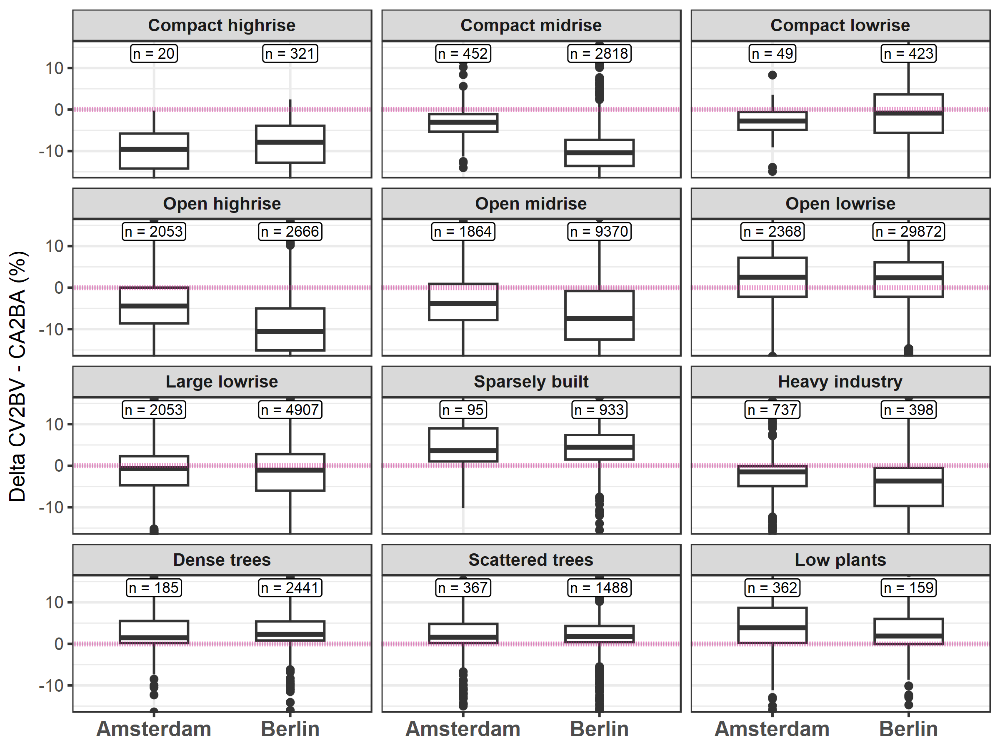

In [14]:
# ---------- Prepare Plot ----------

# Calculate delta CV2BV - CA2BA
combined_3D_canopy_stats_lczv3_dt[CV2BV>0 & CV2BV <100,delta_composit:= CV2BV-CA2BA]

# Character vector of LCZ to exclude
exclude_lczs <- c("Lightweight low-rise", "Bare rock or paved", "Bare soil or sand", "Water")

# Filter LCZs and store in new Data.Table
lcz_filter_combined_3D_canopy_stats_lczv3_dt <- combined_3D_canopy_stats_lczv3_dt[lcz_class_value!=0 & !lcz_description %in% exclude_lczs]

# Sort data.table by grid code
setorder(lcz_filter_combined_3D_canopy_stats_lczv3_dt, lcz_class_value)
# Convert description to factor
lcz_filter_description_levels <- c("Compact highrise","Compact midrise","Compact lowrise",
                            "Open highrise","Open midrise","Open lowrise",
                            "Large lowrise","Sparsely built",
                            "Heavy industry","Dense trees","Scattered trees",
                            "Low plants")
  
# Convert column description to factor for plotting
lcz_filter_combined_3D_canopy_stats_lczv3_dt[, lcz_description := factor(lcz_description, levels=lcz_filter_description_levels)]

# Summarize statistics about deltas for each LCZ
stats_delta_composit_by_lcz <- lcz_filter_combined_3D_canopy_stats_lczv3_dt[CV2BV>0 & CV2BV <100,
                                                                   .(count = .N,
                                                                   min = min(delta_composit),
                                                                   Q1 = quantile(delta_composit, 0.25),
                                                                   median = round(median(delta_composit), digits = 1),
                                                                   mean = mean(delta_composit),
                                                                   Q3 = quantile(delta_composit, 0.75),
                                                                   max = max(delta_composit),
                                                                   sd = sd(delta_composit),
                                                                   IQR = round(IQR(delta_composit), digits=1)),
                                                                   by = c("city_name", "lcz_description")]

# Create count label
stats_delta_composit_by_lcz[, `:=`(label_count = paste0("n = ", count))]

# ---------- Create plot ----------

fig7_boxplot_delta_composit_by_lcz <- ggplot(lcz_filter_combined_3D_canopy_stats_lczv3_dt[CV2BV>0 & CV2BV <100], aes(x = city_name, y=delta_composit)) +
  theme_bw()+
  geom_boxplot(width = 0.5) +
  scale_x_discrete(labels = stringr::str_to_title) +
  labs(y = "Delta CV2BV - CA2BA (%)")+
  facet_wrap(~ lcz_description, ncol = 3)+
  geom_hline(yintercept = c(0), color = "violetred", linetype = "dotted", linewidth = 1) +  # Horizontal lines
  geom_label(data = stats_delta_composit_by_lcz, aes(x = city_name, y = Inf, label = label_count),
            size = 3, vjust = 1.2, fill = "white",  label.padding = unit(0.5, "mm"))+ # add count of cells 
  coord_cartesian(ylim = c(-15,15)) +
  theme(
    strip.text = element_text(size = 10, face = "bold"),  # Facet title size and style
    axis.title.x = element_blank(),  # X-axis label size
    axis.title.y = element_text(size = 12),  # Y-axis label size
    axis.text.x = element_text(size = 12, face="bold"),  # X-axis tick labels
    axis.text.y = element_text(size = 10)   # Y-axis tick labels
  ) 

fig7_boxplot_delta_composit_by_lcz

## Prepare Data for Map Visualiziations

**Steps:**

- Split combined DT with all statistics to individual data.tables for both cities  
- Will be used for subsequent Maps: 
  - Figure 8 (Delta: CV2BV - CA2BA)
  - Figure A1 (LISA Clusters for Canopy Coverage and Canopy 3D Index)
  - Figure A2 (GWR - Canopy Coverage - Canopy 3D Index)
- Keep only columns needed for map display 
    - Delta CV2BV - CA2BA)
    - Canopy Coverage & Canopy 3D Index
- merge to SF holding the grid geometries
- convert SF objects to SpatVector (will inherit CRS for rasterization)

In [15]:
# ----------  Create individual vector geometries with statistics for both cities  ----------

# subset to individual data.tables for both cities
# keep only columns needed for display in map 
amsterdam_map_dt <- combined_3D_canopy_stats_lczv3_dt[city_name=="Amsterdam", c("tile_id", "lcz_description", "lcz_hex_color", "canopy_coverage", "canopy_3D_index","delta_composit")]
berlin_map_dt <-  combined_3D_canopy_stats_lczv3_dt[city_name=="Berlin", c("tile_id", "lcz_description", "lcz_hex_color", "canopy_coverage", "canopy_3D_index","delta_composit")]

# replace in numeric columns NAs with 0 
num_cols <- names(amsterdam_map_dt)[sapply(amsterdam_map_dt, is.numeric)]

amsterdam_map_dt[, (num_cols) := lapply(.SD, function(x) fifelse(is.na(x), 0, x)), .SDcols = num_cols]
berlin_map_dt[, (num_cols) := lapply(.SD, function(x) fifelse(is.na(x), 0, x)), .SDcols = num_cols]


# Convert data.table to data.frame before merging, necessary because caching the knitted version provokes errors
amsterdam_map_df <- as.data.frame(amsterdam_map_dt)
berlin_map_df <- as.data.frame(berlin_map_dt)

# store to sf 
# SF will be used for Global Moran's I later
amsterdam_map_sf <- amsterdam_3D_canopy_stats_lczv3_gpkg %>% 
  dplyr::left_join(amsterdam_map_df, by = "tile_id")
berlin_map_sf <- berlin_3D_canopy_stats_lczv3_gpkg %>% 
  dplyr::left_join(berlin_map_df, by = "tile_id")

# transform to SpatVector (Terra package)
# will inherit CRS for conversion to raster
amsterdam_map_sv <- terra::vect(amsterdam_map_sf)
berlin_map_sv <- terra::vect(berlin_map_sf)

### Figure 8:  Heat map of measured deviations between CV2BV and CA2B

**Steps:**

- Rasterize values
- Build a circular focal‐matrix
- Run the moving‐window
- Create colorblind-safe palette for the heatmaps
- Individual Plots with ggplot2
- Combine Plots

Using plotunit = 'm'

Using plotunit = 'm'



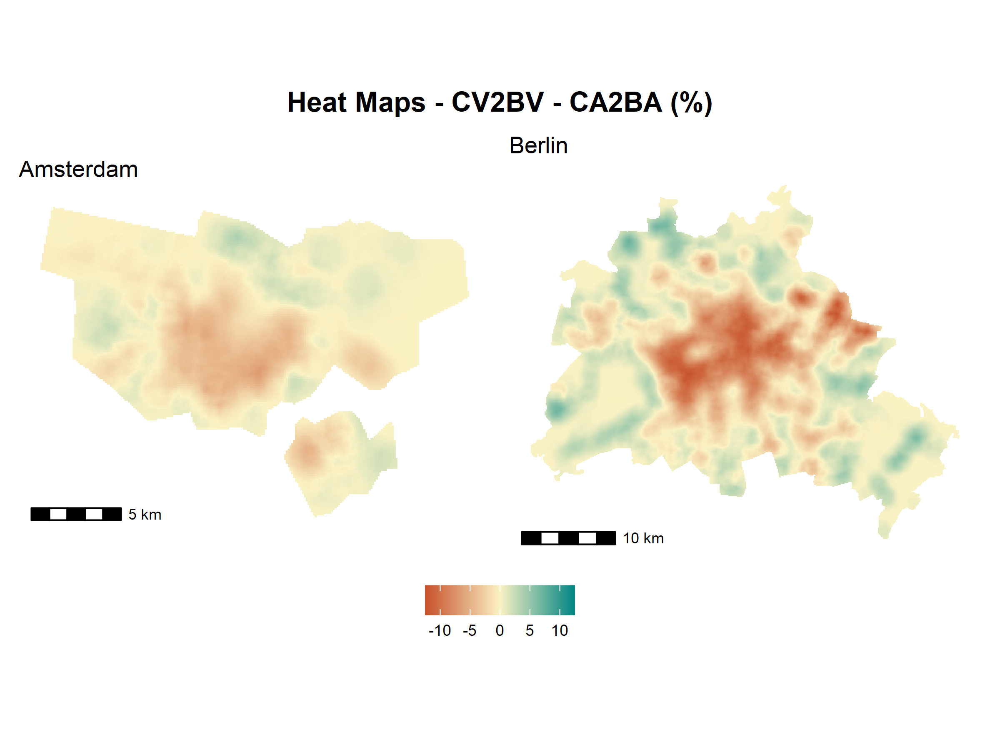

In [16]:
# ----------  Compute Raster for Heatmap ----------

## Delta CV2BV - CA2BA (%)

# Rasterize values (SpatRaster)
# fun="sum"` to burn in an attribute
delta_cv2bv_ca2ba_amsterdam_sr <- terra::rasterize(amsterdam_map_sv,
                     amsterdam_raster_template,
                     field = "delta_composit",
                     fun   = "sum",
                     background = 0)

delta_cv2bv_ca2ba_berlin_sr <- terra::rasterize(berlin_map_sv,
                     berlin_raster_template,
                     field = "delta_composit",
                     fun   = "sum",
                     background = 0)

# Build a circular focal‐matrix for neighborhood radius)
radius <- 1000
amsterdam_focal_window <- terra::focalMat(delta_cv2bv_ca2ba_amsterdam_sr, 
              d    = radius, 
              type = "circle")

berlin_focal_window <- terra::focalMat(delta_cv2bv_ca2ba_berlin_sr, 
              d    = radius, 
              type = "circle")

# Run the moving‐window sum (pads edges so nothing is dropped)
delta_cv2bv_ca2ba_focal_amsterdam <- terra::focal(delta_cv2bv_ca2ba_amsterdam_sr,
               w       = amsterdam_focal_window,
               fun     = "sum",
               na.rm   = TRUE,
               filename = "")

delta_cv2bv_ca2ba_focal_berlin <- terra::focal(delta_cv2bv_ca2ba_berlin_sr,
               w       = berlin_focal_window,
               fun     = "sum",
               na.rm   = TRUE,
               filename = "")

# Mask the raster: set cells outside city boundary to NA
heatmap_amsterdam_sr <- terra::mask(delta_cv2bv_ca2ba_focal_amsterdam, amsterdam_map_sv)
heatmap_berlin_sr <- terra::mask(delta_cv2bv_ca2ba_focal_berlin, berlin_map_sv)

# ----------  Create colorblind-safe palette for the heatmaps ----------

# function to return maximum deviation from 0 for a SpatRaster
get_max_deviation <- function(SpatRaster) {
  minmax <- terra::minmax(SpatRaster)
  max(abs(minmax[1, 1]), abs(minmax[2, 1]))
}

# max deviation for Amsterdam
range_max_a <- get_max_deviation(heatmap_amsterdam_sr)
range_min_a <- -range_max_a

# max deviation for Berlin
range_max_b <- get_max_deviation(heatmap_berlin_sr)
range_min_b <- -range_max_b

#  Build diverging colorblind-safe palette 
# https://emilhvitfeldt.github.io/r-color-palettes/discrete/rcartocolor/Geyser/
cb_palette_full <- divergingx_hcl(11, palette = "Geyser", rev = TRUE)

# 3. Use colorRampPalette to interpolate
heatmap_palette <- colorRampPalette(cb_palette_full[c(1, 6, 11)])

# Build color function using leaflet's colorNumeric()
# use range from Berlin, because min and max values in range are smallest and highest
heatmap_color_palette <- colorNumeric(
  palette = heatmap_palette(255),  # smooth ramp of 255 colors
  domain  = c(range_min_b, range_max_b),
  na.color = "transparent"
)

# Generate colors over the domain for gradient for ggplot
heatmap_gradient_colors <- heatmap_color_palette(seq(range_min_b, range_max_b, length.out = 256))

# ----------  Convert to data.frame and plot with ggplot2 ----------

# Convert to data.frame
heatmap_amsterdam_df <- as.data.frame(heatmap_amsterdam_sr, xy = TRUE)
heatmap_berlin_df <- as.data.frame(heatmap_berlin_sr, xy = TRUE)

 # rename column for clarity
names(heatmap_amsterdam_df)[3] <- "delta_composit" 
names(heatmap_berlin_df)[3] <- "delta_composit" 

# Amsterdam
fig8a_amsterdam_heatmap_plot <- ggplot(heatmap_amsterdam_df, aes(x = x, y = y, fill = delta_composit)) +
  geom_tile() +
  scale_fill_gradientn(
    colors = heatmap_gradient_colors,
    limits = c(-12.5, 12.5),
    guide = "colorbar",
    na.value = "transparent",
    name = "CV2BV - CA2BA (%)"
  ) +
  ggtitle("Amsterdam")+
  guides(fill = guide_colorbar(title = NULL))+
  annotation_scale(
    location = "bl",  # bottom-left corner
    width_hint = 0.2, # size of the scale bar relative to plot
    text_cex = 0.7    # text size
  ) +
  coord_equal() +
  theme_minimal() +
  theme(
    axis.title = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    panel.grid = element_blank()
  ) 

# fig8a_amsterdam_heatmap_plot

# Berlin
fig8b_berlin_heatmap_plot <- ggplot(heatmap_berlin_df, aes(x = x, y = y, fill = delta_composit)) +
  geom_tile() +
  scale_fill_gradientn(
    colors = heatmap_gradient_colors,
    limits = c(-12.5, 12.5),
    guide = "colorbar",
    na.value = "transparent",
    name = "CV2BV - CA2BA (%)"
  ) +
  ggtitle("Berlin")+
  guides(fill = guide_colorbar(title = NULL))+
  annotation_scale(
    location = "bl",  # bottom-left corner
    width_hint = 0.2, # size of the scale bar relative to plot
    text_cex = 0.7    # text size
  ) +
  coord_equal() +
  theme_minimal() +
  theme(
    axis.title = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    panel.grid = element_blank()
  ) 

#fig8b_berlin_heatmap_plot

# ----------  Combine subplots with shared legend using package "patchwork" ----------
 
figure8_heatmaps <- fig8a_amsterdam_heatmap_plot + fig8b_berlin_heatmap_plot + 
  plot_layout(guides = "collect") &   # collect legends into one
  theme(legend.position = "bottom") &  # place legend at bottom
  plot_annotation(
    title = "Heat Maps - CV2BV - CA2BA (%)", theme = theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 16)
    )
  )

figure8_heatmaps

## Appendix

### Figure A1: Local Moran’s I cluster maps 

**Steps:**

- Build neighbors and spatial weights for cells with canopy coverage
- Calculate Global Moran's I 
- Calculate Local Indicators of Spatial Association - LISA
- Create LISA significant cluster plots
  - pysal → follows the PySAL convention, combining the sign of (x_i - x̄) and (lagged x_i - lagged x̄) with significance thresholds (so it only labels a cell HH/LL if the local Moran I is significant).

Warning message in spdep::poly2nb(geometry, queen = queen, ...):
"some observations have no neighbours;
if this seems unexpected, try increasing the snap argument."
Warning message in spdep::poly2nb(geometry, queen = queen, ...):
"some observations have no neighbours;
if this seems unexpected, try increasing the snap argument."
Warning message in lag.listw(listw, z, zero.policy = zero.policy, NAOK = NAOK):
"NAs in lagged values"
Warning message in lag.listw(listw, z, zero.policy = zero.policy, NAOK = NAOK):
"NAs in lagged values"
Warning message in lag.listw(listw, z, zero.policy = zero.policy, NAOK = NAOK):
"NAs in lagged values"
Warning message in lag.listw(listw, z, zero.policy = zero.policy, NAOK = NAOK):
"NAs in lagged values"
Ignoring unknown labels:
• size : "3"
Ignoring unknown labels:
• size : "3"
Ignoring unknown labels:
• size : "3"
Ignoring unknown labels:
• size : "3"


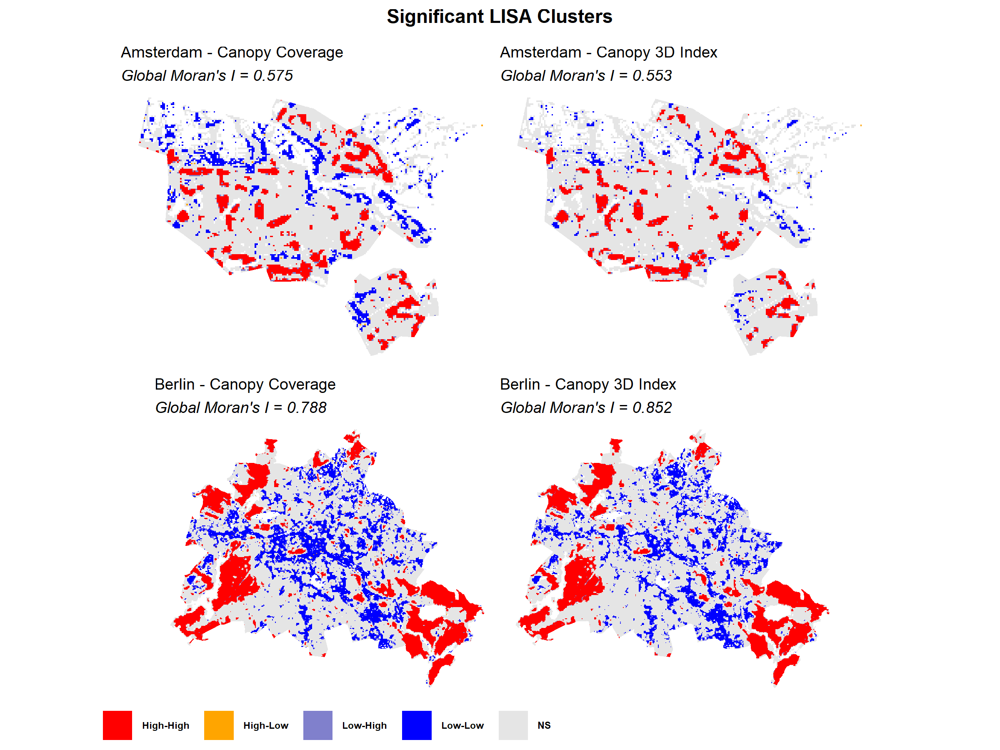

In [17]:
# ----------  Subset analysis grid to only cells with canopy coverage ----------

amsterdam_map_canopy_filtered_sf <- amsterdam_map_sf[amsterdam_map_sf$canopy_coverage > 0 , ]
berlin_map_canopy_filtered_sf <- berlin_map_sf[berlin_map_sf$canopy_coverage > 0 , ]

# ----------  Build neighbors und weights on subset grid ----------

# Queen contiguity neighbors
amsterdam_nb_subset_grid <- sfdep::st_contiguity(amsterdam_map_canopy_filtered_sf)
berlin_nb_subset_grid <- sfdep::st_contiguity(berlin_map_canopy_filtered_sf)

# Row-standardized spatial weights, , allow empty neighbor sets
amsterdam_lw_subset_grid <- sfdep::st_weights(amsterdam_nb_subset_grid, style = "W", allow_zero = TRUE)
berlin_lw_subset_grid <- sfdep::st_weights(berlin_nb_subset_grid, style = "W", , allow_zero = TRUE)

# ----------  Calculate Global Moran’s I ----------

# Canopy Coverage
amsterdam_subset_glob_moran_cov <- sfdep::global_moran(
  x = amsterdam_map_canopy_filtered_sf$canopy_coverage,
  nb = amsterdam_nb_subset_grid,
  wt = amsterdam_lw_subset_grid, 
  na_ok = TRUE 
  )
berlin_subset_glob_moran_cov <- sfdep::global_moran(
  x = berlin_map_canopy_filtered_sf$canopy_coverage,
  nb = berlin_nb_subset_grid,
  wt = berlin_lw_subset_grid,
  na_ok = TRUE 
  )

# Canopy 3D Index
amsterdam_subset_glob_moran_c3d <- sfdep::global_moran(
  x = amsterdam_map_canopy_filtered_sf$canopy_3D_index,
  nb = amsterdam_nb_subset_grid,
  wt = amsterdam_lw_subset_grid, 
  na_ok = TRUE 
  )

berlin_subset_glob_moran_c3d <- sfdep::global_moran(
  x = berlin_map_canopy_filtered_sf$canopy_3D_index,
  nb = berlin_nb_subset_grid,
  wt = berlin_lw_subset_grid, 
  na_ok = TRUE 
  )


# ----------  Calculate Local Indicators of Spatial Association - LISA ----------

# Coverage
amsterdam_subset_lisa_cov <- sfdep::local_moran(
  x = amsterdam_map_canopy_filtered_sf$canopy_coverage,
  nb = amsterdam_nb_subset_grid,
  wt = amsterdam_lw_subset_grid,
  zero.policy=TRUE  # allows NAs in lagged values
)

berlin_subset_lisa_cov <- sfdep::local_moran(
  x = berlin_map_canopy_filtered_sf$canopy_coverage,
  nb = berlin_nb_subset_grid,
  wt = berlin_lw_subset_grid,
  zero.policy=TRUE  # allows NAs in lagged values
)
# Canopy 3D Index 
amsterdam_subset_lisa_c3d <- sfdep::local_moran(
  x = amsterdam_map_canopy_filtered_sf$canopy_3D_index,
  nb = amsterdam_nb_subset_grid,
  wt = amsterdam_lw_subset_grid,
  zero.policy=TRUE  # allows NAs in lagged values
)

berlin_subset_lisa_c3d <- sfdep::local_moran(
  x = berlin_map_canopy_filtered_sf$canopy_3D_index,
  nb = berlin_nb_subset_grid,
  wt = berlin_lw_subset_grid,
  zero.policy=TRUE  # allows NAs in lagged values
)

# ----------  Attach results back to grid ----------

# Coverage
amsterdam_map_canopy_filtered_sf$lisa_cov_I <- amsterdam_subset_lisa_cov$ii
amsterdam_map_canopy_filtered_sf$lisa_cov_p <- amsterdam_subset_lisa_cov$p_ii

berlin_map_canopy_filtered_sf$lisa_cov_I <- berlin_subset_lisa_cov$ii
berlin_map_canopy_filtered_sf$lisa_cov_p <- berlin_subset_lisa_cov$p_ii

# Canopy 3D Index
amsterdam_map_canopy_filtered_sf$lisa_c3d_I <- amsterdam_subset_lisa_c3d$ii
amsterdam_map_canopy_filtered_sf$lisa_c3d_p <- amsterdam_subset_lisa_c3d$p_ii

berlin_map_canopy_filtered_sf$lisa_c3d_I <- berlin_subset_lisa_c3d$ii
berlin_map_canopy_filtered_sf$lisa_c3d_p <- berlin_subset_lisa_c3d$p_ii

# ---------- Plot significant LISA clusters ----------

## Canopy Coverage 
# Use pysal classification (significant clusters only)
amsterdam_map_canopy_filtered_sf$cluster_cov <- amsterdam_subset_lisa_cov$pysal
berlin_map_canopy_filtered_sf$cluster_cov <- berlin_subset_lisa_cov$pysal

# Assign values to new column
amsterdam_map_canopy_filtered_sf$cluster_sig_cov <- as.character(amsterdam_map_canopy_filtered_sf$cluster_cov) 
berlin_map_canopy_filtered_sf$cluster_sig_cov <- as.character(berlin_map_canopy_filtered_sf$cluster_cov) 

#  Mask non-significant cells
amsterdam_map_canopy_filtered_sf$cluster_sig_cov[amsterdam_map_canopy_filtered_sf$lisa_cov_p >= 0.05] <- "NS"
berlin_map_canopy_filtered_sf$cluster_sig_cov[berlin_map_canopy_filtered_sf$lisa_cov_p >= 0.05] <- "NS"

## Canopy 3D Index
# Use pysal classification (significant clusters only)
amsterdam_map_canopy_filtered_sf$cluster_c3d  <- amsterdam_subset_lisa_c3d$pysal
berlin_map_canopy_filtered_sf$cluster_c3d  <- berlin_subset_lisa_c3d$pysal

# Assign values to new column
amsterdam_map_canopy_filtered_sf$cluster_sig_c3d <- as.character(amsterdam_map_canopy_filtered_sf$cluster_c3d) 
berlin_map_canopy_filtered_sf$cluster_sig_c3d <- as.character(berlin_map_canopy_filtered_sf$cluster_c3d) 

#  Mask non-significant cells
amsterdam_map_canopy_filtered_sf$cluster_sig_c3d[amsterdam_map_canopy_filtered_sf$lisa_c3d_p >= 0.05] <- "NS"
berlin_map_canopy_filtered_sf$cluster_sig_c3d[berlin_map_canopy_filtered_sf$lisa_c3d_p >= 0.05] <- "NS"

# Define a color palette
lisa_descrete_col_pal <- c(
  "High-High" = "red",
  "Low-Low"   = "blue",
  "High-Low"  = "orange",
  "Low-High"  = "#8080CC",
  "NS"        = "grey90"
)

# ----------  Prepare for Leaflet ----------

# Add numerical codes 
# Amsterdam
amsterdam_map_canopy_filtered_sf$cluster_sig_cov_num <- ifelse(
  amsterdam_map_canopy_filtered_sf$cluster_sig_cov == "High-High", 1,
    ifelse(amsterdam_map_canopy_filtered_sf$cluster_sig_cov == "Low-Low", 2,
      ifelse(amsterdam_map_canopy_filtered_sf$cluster_sig_cov == "High-Low", 3,
        ifelse(amsterdam_map_canopy_filtered_sf$cluster_sig_cov == "Low-High", 4, 5))))
 
amsterdam_map_canopy_filtered_sf$cluster_sig_c3d_num <- ifelse(
 amsterdam_map_canopy_filtered_sf$cluster_sig_c3d == "High-High", 1,
  ifelse(amsterdam_map_canopy_filtered_sf$cluster_sig_c3d == "Low-Low", 2,
         ifelse(amsterdam_map_canopy_filtered_sf$cluster_sig_c3d == "High-Low", 3,
                ifelse( amsterdam_map_canopy_filtered_sf$cluster_sig_c3d == "Low-High", 4, 5))))

# Berlin 
berlin_map_canopy_filtered_sf$cluster_sig_cov_num <- ifelse(
 berlin_map_canopy_filtered_sf$cluster_sig_cov == "High-High", 1,
  ifelse( berlin_map_canopy_filtered_sf$cluster_sig_cov == "Low-Low", 2,
         ifelse( berlin_map_canopy_filtered_sf$cluster_sig_cov == "High-Low", 3,
                ifelse( berlin_map_canopy_filtered_sf$cluster_sig_cov == "Low-High", 4, 5))))
 
berlin_map_canopy_filtered_sf$cluster_sig_c3d_num <- ifelse(
   berlin_map_canopy_filtered_sf$cluster_sig_c3d == "High-High", 1,
  ifelse( berlin_map_canopy_filtered_sf$cluster_sig_c3d == "Low-Low", 2,
         ifelse( berlin_map_canopy_filtered_sf$cluster_sig_c3d == "High-Low", 3,
                ifelse( berlin_map_canopy_filtered_sf$cluster_sig_c3d == "Low-High", 4, 5))))

# Rasterize using numeric columns
amsterdam_map_cluster_sig_cov_num_sr <- terra::rasterize(amsterdam_map_canopy_filtered_sf, 
                                              amsterdam_raster_template, 
                                              field = "cluster_sig_cov_num", 
                                              fun = "max")

amsterdam_map_cluster_sig_c3d_num_sr <- terra::rasterize(amsterdam_map_canopy_filtered_sf, 
                                              amsterdam_raster_template, 
                                              field = "cluster_sig_c3d_num", 
                                              fun = "max")

berlin_map_cluster_sig_cov_num_sr <- terra::rasterize(berlin_map_canopy_filtered_sf, 
                                            berlin_raster_template, 
                                            field = "cluster_sig_cov_num", 
                                            fun = "max")

berlin_map_cluster_sig_c3d_num_sr <- terra::rasterize(berlin_map_canopy_filtered_sf, 
                                            berlin_raster_template, 
                                            field = "cluster_sig_c3d_num", 
                                            fun = "max")

# Extract colors in the order of numeric codes
lisa_colors <- lisa_descrete_col_pal[names(lisa_descrete_col_pal)]

lisa_cluster_col_pal <- colorNumeric(
    palette = lisa_colors,  # vector of colors
    domain = 1:5,  # numeric codes
    na.color = "transparent"
)

# ----------  Create the 4 plots ----------

# Amsterdam - LISA - Canopy Coverage 
amsterdam_subset_lisa_cov_cluster_plot <- ggplot(amsterdam_map_canopy_filtered_sf) +
  geom_sf(aes(fill = cluster_sig_cov), color = NA) +
  theme_minimal() +
  scale_fill_manual(values = lisa_descrete_col_pal) +
  labs(
    title = "Amsterdam - Canopy Coverage", size = 3,
    subtitle = paste0("Global Moran's I = ", round(amsterdam_subset_glob_moran_cov$I, 3))
    )+
  theme_void() +             # remove axes, ticks, grid
  theme(
    plot.title = element_text(hjust = 0, size = 9),   # title 11 pt
    plot.subtitle = element_text(size = 9, face = "italic", hjust = 0, margin =  margin(t = 5)),
    legend.position = "none",                 # legend labels
    ) 

# Amsterdam - LISA - Canopy 3D Index
amsterdam_subset_lisa_c3d_cluster_plot <- ggplot(amsterdam_map_canopy_filtered_sf) +
  geom_sf(aes(fill = cluster_sig_c3d), color = NA) +
  theme_minimal() +
  scale_fill_manual(values = lisa_descrete_col_pal) +
  labs(
    title = "Amsterdam - Canopy 3D Index", size = 3, 
    subtitle = paste0("Global Moran's I = ", round(amsterdam_subset_glob_moran_c3d$I, 3))
    )+
  theme_void() +             # remove axes, ticks, grid
  theme(
    plot.title = element_text(hjust = 0, size = 9),   # title 11 pt
    plot.subtitle = element_text(size = 9, face = "italic", hjust = 0, margin =  margin(t = 5)),
    legend.position = "none",                # legend labels
    ) 
 
# Berlin - LISA - Canopy Coverage
berlin_subset_lisa_cov_cluster_plot <- ggplot(berlin_map_canopy_filtered_sf) +
  geom_sf(aes(fill = cluster_sig_cov), color = NA) +
  theme_minimal() +
  scale_fill_manual(values = lisa_descrete_col_pal) +
  labs(
    title = "Berlin - Canopy Coverage", size = 3, 
    subtitle = paste0("Global Moran's I = ", round(berlin_subset_glob_moran_cov$I, 3))
  )+
  theme_void() +             # remove axes, ticks, grid
  theme(
    plot.title = element_text(hjust = 0, size = 9),   # title 11 pt
    plot.subtitle = element_text(size = 9, face = "italic", hjust = 0, margin =  margin(t = 5)),
    # title 11 pt
    legend.position = "bottom",
    legend.title = element_blank(),              # legend title
    legend.text = element_text(size = 5.5, face = "bold"), 
    )

# Berlin - LISA - Canopy 3D Index
berlin_subset_lisa_c3d_cluster_plot <- ggplot(berlin_map_canopy_filtered_sf) +
  geom_sf(aes(fill = cluster_sig_c3d), color = NA) +
  theme_minimal() +
  scale_fill_manual(values = lisa_descrete_col_pal) +
  labs(
    title = "Berlin - Canopy 3D Index", size = 3, 
    subtitle = paste0("Global Moran's I = ", round(berlin_subset_glob_moran_c3d$I, 3))
  )+
  theme_void() +             # remove axes, ticks, grid
  theme(
    plot.title = element_text(hjust = 0, size = 9),   # title 11 pt
    plot.subtitle = element_text(size = 9, face = "italic", hjust = 0, margin =  margin(t = 5)),
    legend.position = "none",                 # legend labels
    )

# ----------  Combine subplots with shared legend using package "patchwork" ----------

# Combine the 4 panels with patchwork package 
figa1_lisa_cluster_plots <- (amsterdam_subset_lisa_cov_cluster_plot + amsterdam_subset_lisa_c3d_cluster_plot) / (berlin_subset_lisa_cov_cluster_plot + berlin_subset_lisa_c3d_cluster_plot) +
  plot_annotation(
    title = "Significant LISA Clusters",
    theme = theme(plot.title = element_text(size = 11, face = "bold", hjust = 0.5))
  ) 
    
 figa1_lisa_cluster_plots


### Appendice 2: Geographically Weighted Regression 

**Steps:**

- Analyze whether relationships between Canopy Coverage and Canopy 3D Index change across the study areas̄
- Choose bandwidth 
  - Algorithm to find adaptive bandwdth based on a number of neighbors (k-nearest) suggests: 
    - Amsterdam: Bandwidth -> 36
    - Berlin: Bandwidth -> 28
  - We stay with adaptive bandwidth to ensure regression stays stable
  - But choose smaller adaptive bandwidth of 12 KNN to see whether local coefficients change
- Calculate GWR with adpative bandwidth
  -*To avoid unnecessary re‑computation and to make the analysis reproducible, the GWR model was fitted once, the resulting object of class gwrm was exported with saveRDS(), and the subsequent script simply reads this object back with readRDS(). This approach preserves the full model output (coefficients, diagnostics, hat matrix, etc.) while  reducing runtime for analyses and visualisations steps.*
- *Note:* Calculation of GWR is computionally intensive and may take some time*

Using plotunit = 'm'

Using plotunit = 'm'



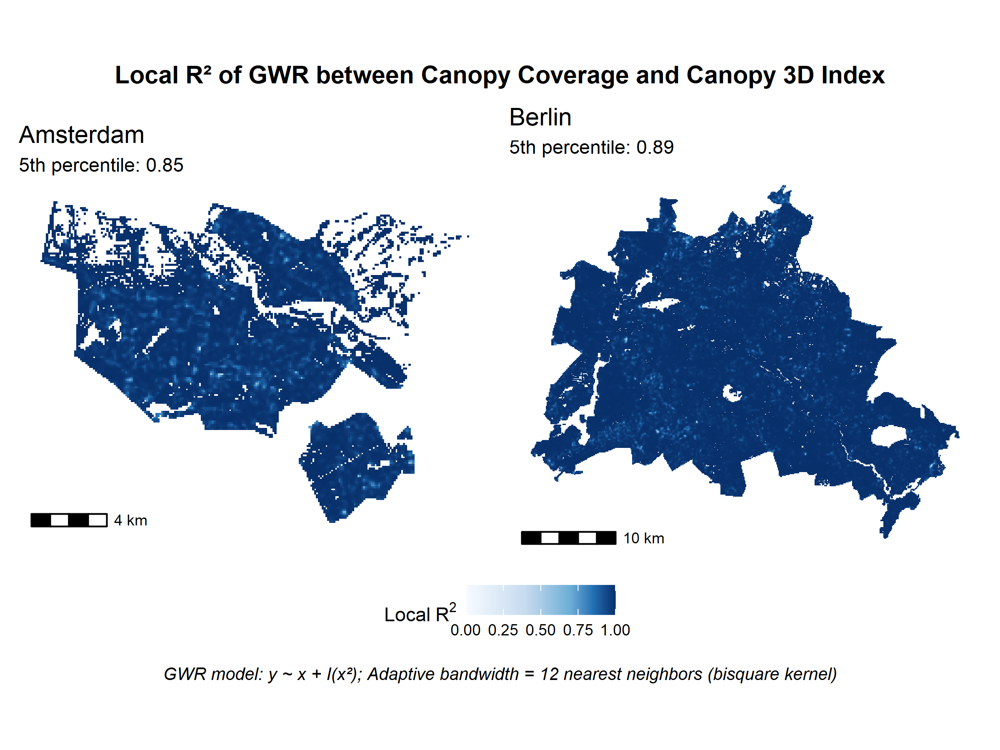

In [18]:
# ----------  Choose Bandwidth ----------

# Adaptive bandwidth 
# Bandwidth is based on a number of neighbors (k-nearest), not distance.
# Ensures each local regression has at least k observations → handles sparse areas naturally.
# Very common for urban grids with missing data or irregular density.

# Code to determine the optimal spatial bandwidth that will be used when fitting a Geographically Weighted Regression (GWR) model
# # amsterdam_bw <- bw.gwr(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2), 
#                        data = amsterdam_map_canopy_filtered_sf,
#                        approach = "AICc", 
#                        kernel = "bisquare", 
#                        adaptive = TRUE)
# 
# 
# # berlin_bw <- bw.gwr(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2), 
#                        data = berlin_map_canopy_filtered_sf,
#                        approach = "AICc", 
#                        kernel = "bisquare", 
#                       adaptive = TRUE)

# Smaller bandwidth is used to obtain local, highly variable coefficient surfaces 
amsterdam_bw <- 12
berlin_bw <- 12

# ----------  Calculate GWR  ----------

# # GWR width adaptive bandwidth
# amsterdam_gwr_basic <- gwr.basic(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2),
#                      data = amsterdam_map_canopy_filtered_sf,
#                      bw = amsterdam_bw,
#                      kernel = "bisquare",
#                      adaptive = TRUE)
# 
# berlin_gwr_basic <- gwr.basic(canopy_3D_index ~ canopy_coverage + I(canopy_coverage^2),
#                      data = berlin_map_canopy_filtered_sf,
#                      bw = berlin_bw,
#                      kernel = "bisquare",
#                      adaptive = TRUE)

# ----------  Read pre-fitted GW ----------

# paths to fitted GWR with adaptive bandwidth of 12 nearest neighbors
amsterdam_gwr_basic_rds_path <- here::here( 'data', 'app_a2_gwr_results', 'amsterdam_gwr_canopy_indicators_adaptive_bandwidth_12_bisquare_kernel.rds')
berlin_gwr_basic_rds_path <- here::here( 'data', 'app_a2_gwr_results', 'berlin_gwr_canopy_indicators_adaptive_bandwidth_12_bisquare_kernel.rds')

# read as list of class “gwrm”: 
amsterdam_gwr_basic <- readRDS(amsterdam_gwr_basic_rds_path)
berlin_gwr_basic<- readRDS(berlin_gwr_basic_rds_path)

# Attach local R² to sf object
amsterdam_map_canopy_filtered_sf$Local_R2 <- amsterdam_gwr_basic$SDF$Local_R2
berlin_map_canopy_filtered_sf$Local_R2 <- berlin_gwr_basic$SDF$Local_R2

# Local R² can be negative for cells with very small adaptive bandwidth or Sparse or irregular data → unstable local estimates.
# Reclassify to 0
amsterdam_map_canopy_filtered_sf$Local_R2[amsterdam_map_canopy_filtered_sf$Local_R2 < 0] <- 0
berlin_map_canopy_filtered_sf$Local_R2[berlin_map_canopy_filtered_sf$Local_R2 < 0] <- 0

# ----------  Create Subplots ----------

# Convert to SpatRasters 
gwr_local_r_map_amsterdam_sr <- terra::rasterize(amsterdam_map_canopy_filtered_sf,
                     amsterdam_raster_template,
                     field = "Local_R2",
                     fun   = "max",
                     background = NA)

gwr_local_r_map_berlin_sr <- terra::rasterize(berlin_map_canopy_filtered_sf,
                     berlin_raster_template,
                     field = "Local_R2",
                     fun   = "max",
                     background = NA)

# Convert SpatRasters to DF for ggplot
gwr_local_r_map_amsterdam_df <- as.data.frame(gwr_local_r_map_amsterdam_sr, xy = TRUE)
gwr_local_r_map_berlin_df <- as.data.frame(gwr_local_r_map_berlin_sr, xy = TRUE)

# calculate 5th percentile of Local R
amsterdam_local_r2_pct05 <- round(quantile(gwr_local_r_map_amsterdam_df$Local_R2, 0.01, na.rm = TRUE), digits=2)
berlin_local_r2_pct05 <- round(quantile(gwr_local_r_map_berlin_df$Local_R2, 0.01, na.rm = TRUE), digits=2)

# define common legend fill 
local_r2_scale_fill <- scale_fill_viridis_c(
  limits = c(0, 1),
  option = "inferno",
  direction = 1,
  na.value = "transparent",
  name = "Local R²"
)

local_r2_scale_fill <- scale_fill_gradientn(
  colours = c("#f7fbff", "#c6dbef", "#6baed6", "#2171b5", "#08306b"),
  values = scales::rescale(c(0, 0.4, 0.7, 0.85, 1)),  # stretch high range
  limits = c(0, 1),
  na.value = "transparent",
  name = expression(Local~R^2)
)

# create color palette for leeflet map
local_r2_pal <- colorNumeric(
  palette = c("#f7fbff", "#c6dbef", "#6baed6", "#2171b5", "#08306b"),
  domain = c(0, 1),           # range of Local R²
  na.color = "transparent"
)

# Individual Plot for Amsterdam
app_2a_amsterdam_gwr_local_r2_plot <- ggplot(gwr_local_r_map_amsterdam_df, aes(x, y, fill = Local_R2)) +
  geom_tile() +
  local_r2_scale_fill +        # includes name, na.value, limits
  annotation_scale(
    location = "bl",
    width_hint = 0.2,
    text_cex = 0.7
    ) +
  labs(
    title = "Amsterdam" ,
    subtitle = paste0("5th percentile: ", amsterdam_local_r2_pct05)
    ) +
  coord_equal() +
  theme(
    plot.title = element_text(size = 14,),
    plot.caption = element_text(size = 10, hjust = 0.5, face = "italic"),
    axis.title = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    panel.grid = element_blank(),
    panel.background = element_rect(fill = "transparent", color = NA)
  ) 

# Individual Plot for Berlin
app_2b_berlin_gwr_local_r2_plot <- ggplot(gwr_local_r_map_berlin_df, aes(x, y, fill = Local_R2)) +
  geom_tile() +
  local_r2_scale_fill +        # includes name, na.value, limits
  annotation_scale(
    location = "bl",
    width_hint = 0.2,
    text_cex = 0.7
  ) +
  labs(
    title = "Berlin" ,
    subtitle = paste0("5th percentile: ", berlin_local_r2_pct05)
    ) +
  coord_equal() +
  theme(
    plot.title = element_text(size = 14,),
    plot.caption = element_text(size = 10, hjust = 0.5, face = "italic"),
    axis.title = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    panel.grid = element_blank(),
    panel.background = element_rect(fill = "transparent", color = NA)
  ) 


# ----------  Combine the 2 plots with patchwork package  ----------

app_2_gwr_local_r2_plot <- app_2a_amsterdam_gwr_local_r2_plot + app_2b_berlin_gwr_local_r2_plot +
  plot_layout(guides = "collect") &   # collect legends into one
  theme(legend.position = "bottom") &  # place legend at bottom  
  plot_annotation(
    title = "Local R² of GWR between Canopy Coverage and Canopy 3D Index",
    caption = "GWR model: y ~ x + I(x²); Adaptive bandwidth = 12 nearest neighbors (bisquare kernel)",
    theme = theme(
      plot.title = element_text(size = 14, face = "bold", hjust = 0.5),
      plot.caption = element_text(size = 10, hjust = 0.5, face = "italic")
    )
  )
 
 app_2_gwr_local_r2_plot

## Leaflet Map Viewer

**Notes:**

- Combine Figure 2, Figure 8, Figure A1, Figure A2 in one dynamic map (Leaflet) for each city
- Display results as raster layer for fast rendering with Leaflet
- Submitted Figures 2 and 8 show same content but were layouted using ArcGIS

**Steps:**

- Create Leaflet Maps
  - One Map per City
  - Overlay Heatmap and LCZ Map
  - Add legend for Heatmap
  - Add layer control to switch layers on and off

### Prepare Viewer Layout

In [19]:
IRdisplay::display_javascript("
  var outputs = document.querySelectorAll('.output');
  outputs.forEach(function(el) {
    el.style.height = '7070px';
    el.style.maxHeight = 'none';
    el.style.overflow = 'visible';
  });
")

In [20]:
IRdisplay::display_javascript("
  var outputs = document.querySelectorAll('.output');
  outputs.forEach(function(el) {
    el.style.height = '7070px';
    el.style.maxHeight = 'none';
    el.style.overflow = 'visible';
  });
")

### Amsterdam Map

Shiny tags cannot be represented in plain text (need html)
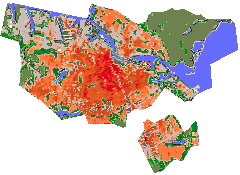
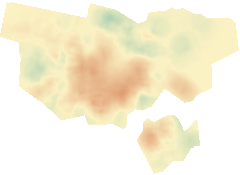
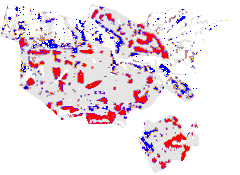
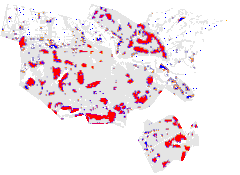
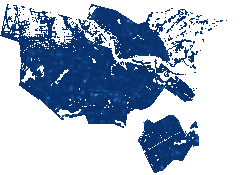

In [21]:
# Amsterdam
leaflet_map_amsterdam <- tags$div(
  style = "width:800px; margin:auto;",
  leaflet(options = leafletOptions(minZoom = 2)) %>%
    addProviderTiles("CartoDB.Positron") %>%  # nice, clean basemap
    
    # Add LCZ Raster Layer
    addRasterImage(
      lcz_map_amsterdam_sr,
      color=lcz_amsterdam_pal,
      opacity = 1,
      project = TRUE, 
      group = "LCZ Map"
      ) %>%
    
    # Add Heatmap Delta CV2BV - CA2BA
    addRasterImage(
      heatmap_amsterdam_sr,
      colors   = heatmap_color_palette,
      opacity  = 1,
      project  = TRUE, 
      group = "CV2BV - CA2BA"
      ) %>%
    # Add Legend Delta CV2BV - CA2BA
    addLegend(
      pal     = heatmap_color_palette,
      values  = c(range_min_b, range_max_b),
      title   = "CVBV - CABA (%)",
      position = "bottomleft"
      ) %>%
    
    # Add LISA Clusters for Canopy Coverage
    addRasterImage(
      amsterdam_map_cluster_sig_cov_num_sr,
      colors   = lisa_cluster_col_pal,
      opacity  = 1,
      project  = TRUE, 
      group = "LISA Coverage"
    ) %>%
    
    # Add LISA Clusters for Canopy 3D Index
    addRasterImage(
      amsterdam_map_cluster_sig_c3d_num_sr,
      colors   = lisa_cluster_col_pal,
      opacity  = 1,
      project  = TRUE, 
      group = "LISA Canopy 3D Index"
      ) %>%
    
    # Add GWR 
    addRasterImage(
      gwr_local_r_map_amsterdam_sr,
      colors = local_r2_pal,
      opacity = 0.8,
      project = TRUE,  # ensures raster is projected to WGS84 if needed
      group = "Local R²"
    ) %>%
    addLegend(
      pal = local_r2_pal,
      values = c(0,1),
      title = "Local R²",
      position = "bottomleft"
    ) %>%
    
    addScaleBar(
      position = "bottomright",
      options = scaleBarOptions(imperial=FALSE)
      ) %>%
    addLayersControl(
      overlayGroups = c("LCZ Map", "CV2BV - CA2BA", "LISA Coverage", "LISA Canopy 3D Index", "Local R²"),
      options = layersControlOptions(collapsed = FALSE)
     )
  )

leaflet_map_amsterdam

### Berlin Map

Shiny tags cannot be represented in plain text (need html)
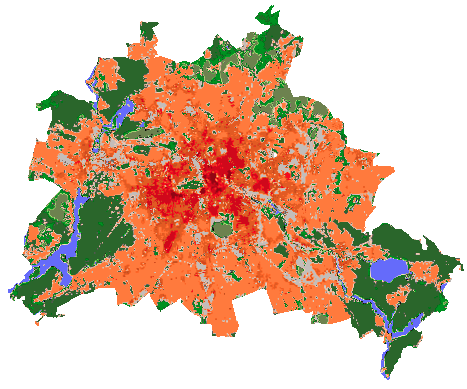
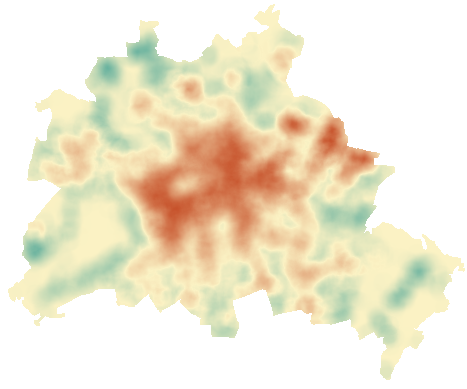
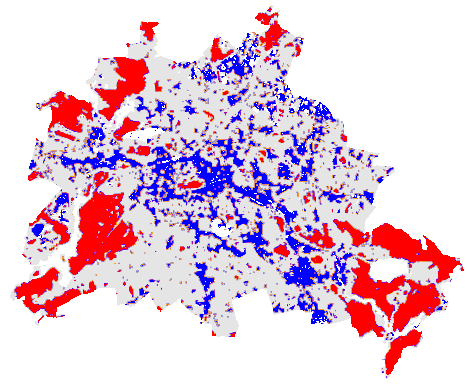
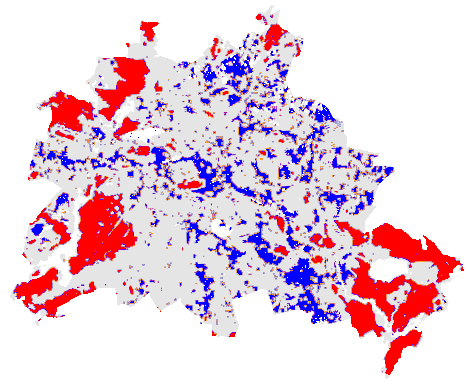
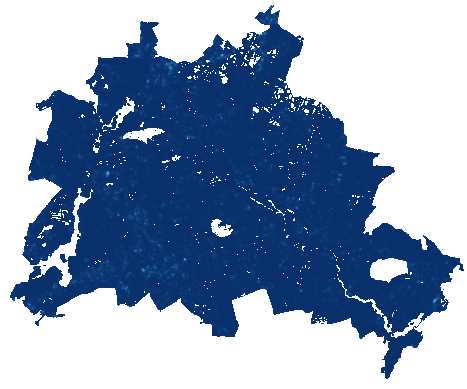

In [22]:
# Berlin
leaflet_map_berlin <- tags$div(
  style = "width:800px; margin:auto;",
  leaflet(options = leafletOptions(minZoom = 2)) %>%
    addProviderTiles("CartoDB.Positron") %>%  # nice, clean basemap

    # Add LCZ Raster Layer
    addRasterImage(
      lcz_map_berlin_sr,
      color=lcz_berlin_pal,
      opacity = 1,
      project = TRUE, 
      group = "LCZ Map"
      ) %>%
    
    # Add Heatmap Delta CV2BV - CA2BA
    addRasterImage(
      heatmap_berlin_sr,
      colors   = heatmap_color_palette,
      opacity  = 1,
      project  = TRUE, 
      group = "CV2BV - CA2BA"
      ) %>%
    # Add Legend Delta CV2BV - CA2BA
    addLegend(
      pal     = heatmap_color_palette,
      values  = c(range_min_b, range_max_b),
      title   = "CVBV - CABA (%)",
      position = "bottomleft"
      ) %>%
    
    # Add LISA Clusters for Canopy Coverage
    addRasterImage(
      berlin_map_cluster_sig_cov_num_sr,
      colors   = lisa_cluster_col_pal,
      opacity  = 1,
      project  = TRUE, 
      group = "LISA Coverage"
    ) %>%
    
    # Add LISA Clusters for Canopy 3D Index
    addRasterImage(
      berlin_map_cluster_sig_c3d_num_sr,
      colors   = lisa_cluster_col_pal,
      opacity  = 1,
      project  = TRUE, 
      group = "LISA Canopy 3D Index"
      ) %>%
    
    # Add GWR 
    addRasterImage(
      gwr_local_r_map_berlin_sr,
      colors = local_r2_pal,
      opacity = 0.8,
      project = TRUE,  # ensures raster is projected to WGS84 if needed
      group = "Local R²"
    ) %>%
    addLegend(
      pal = local_r2_pal,
      values = c(0,1),
      title = "Local R²",
      position = "bottomleft"
    ) %>%
    
    addScaleBar(
      position = "bottomright",
      options = scaleBarOptions(imperial=FALSE)
      ) %>%
    addLayersControl(
      overlayGroups = c("LCZ Map", "CV2BV - CA2BA", "LISA Coverage", "LISA Canopy 3D Index", "Local R²"),
      options = layersControlOptions(collapsed = FALSE)
     )
  )

leaflet_map_berlin